# License
our code uses the MIT license. Part of our implementation is inspired by the code from [habitat_sim (MIT license)](https://aihabitat.org/), [LSeg (MIT license)](https://github.com/isl-org/lang-seg), and [CLIP (MIT license)](https://github.com/openai/CLIP). We would like to express our gratitude to the developers of these projects.

### Conda Environment and GPU Setup

In [65]:
import os, sys
env_bin = os.path.join(sys.prefix, "bin")
os.environ["PATH"] = env_bin + os.pathsep + os.environ.get("PATH", "")
print("New PATH starts with:", os.environ["PATH"].split(os.pathsep)[0])
print("This notebook is running under:", sys.executable)
!which conda

New PATH starts with: /home/jovyan/teaching_material/msc/envs/vlmaps6/bin
This notebook is running under: /home/jovyan/teaching_material/msc/envs/vlmaps6/bin/python
/home/jovyan/teaching_material/msc/envs/vlmaps6/bin/conda


In [2]:
# Ensure that you use CUDA 11.0 and it works!!!
import torch
print("PyTorch version:", torch.__version__) # Should output "Pytorch version: 1.7.1"
print("CUDA toolkit:", torch.version.cuda)
print("Device SM capability:", torch.cuda.get_device_capability())
print(torch.cuda.is_available()) # Should return "True" if GPU support is active

PyTorch version: 2.3.1+cu118
CUDA toolkit: 11.8
Device SM capability: (8, 6)
True


In [3]:
# Should be at least CUDA 11.0 or higher
!nvidia-smi

Mon Aug  4 09:18:47 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A40                     On  |   00000000:E3:00.0 Off |                    0 |
|  0%   27C    P8             31W /  300W |       3MiB /  46068MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

# Settings

In [4]:
# available model types: "lseg", "openseed"
MODEL_TYPE = "openseed"
REPO_NEEDS_SETUP = False # Set to 'True' ONLY ONCE -> to download data etc.

# Download Data and Install Dependencies

In [5]:
# !pip install tqdm
# !pip install "imageio[ffmpeg]"
# !pip install opencv-python
# Windows + Linux
# !pip install git+https://github.com/openai/CLIP.git
# !pip install pandas
# !pip install timm
# !pip install pytorch-lightning
# !pip uninstall -y pillow
# !pip install pillow==9.4.0
# !pip installpip install --upgrade "pytorch-lightning==2.3.3"
# !pip install lightning-fabric
# !conda install -c conda-forge cudatoolkit-dev -y
# !python -m pip install 'git+https://github.com/MaureenZOU/detectron2-xyz.git'

In [6]:
# WINDOWS: pwd is not supported -> set paths manually
root_dir = !pwd
root_dir = root_dir[0]

In [7]:
!gdown --version

gdown 5.2.0 at /home/jovyan/teaching_material/msc/envs/vlmaps6/lib/python3.8/site-packages


In [8]:
if REPO_NEEDS_SETUP:
    !mkdir -p data
    %cd data
    # !gdown --version # check if package installed
    !gdown 1wjuiVcO92Rqer5gLk-X7hINfe4PCMQmu # 2.75G image data (1159 frames)
    # WINDOWS: comment out the !unzip line and unzip it manually
    # WINDOWS: MAKE SURE that the LAST "5LpN3gDmAk7_1" folder is at same level as the .zip (unzipping will give another 5LpN3gDmAk7_1 within a 5LpN3gDmAk7_1 folder)
    !unzip -o 5LpN3gDmAk7_1.zip | tqdm --desc extracted --unit files --unit_scale --total `unzip -l 5LpN3gDmAk7_1.zip | tail -n 1 | xargs echo -n | cut -d' ' -f2` > /dev/null
    %cd ..

In [9]:
data_dir = os.path.join(root_dir, "data", "5LpN3gDmAk7_1")

In [10]:
print(data_dir) # should end with "MSc-Thesis/data/5LpN3gDmAk7_1"
print(root_dir) # should end with "MSc-Thesis"

/home/jovyan/teaching_material/msc/MSc-Thesis/data/5LpN3gDmAk7_1
/home/jovyan/teaching_material/msc/MSc-Thesis


# Visualize the Dataset

In [11]:
# @title Helper functions for video creation and display
import sys
import os
import imageio
import numpy as np
import cv2
import tqdm
from IPython.display import HTML
from base64 import b64encode

if "google.colab" in sys.modules:
    os.environ["IMAGEIO_FFMPEG_EXE"] = "/usr/bin/ffmpeg"

# @markdown if the colab instance doesn't have GPU, untick the following checkbox
has_gpu = True # @param {type: "boolean"}
codec = "h264"
if has_gpu:
    codec = "h264_nvenc"

def load_depth(depth_filepath):
    with open(depth_filepath, 'rb') as f:
        depth = np.load(f)
    return depth

def get_fast_video_writer(video_file: str, fps: int = 60):
    if (
        "google.colab" in sys.modules
        and os.path.splitext(video_file)[-1] == ".mp4"
        and os.environ.get("IMAGEIO_FFMPEG_EXE") == "/usr/bin/ffmpeg"
    ):
        # USE GPU Accelerated Hardware Encoding
        writer = imageio.get_writer(
            video_file,
            fps=fps,
            codec=codec,
            mode="I",
            bitrate="1000k",
            format="FFMPEG",
            ffmpeg_log_level="info",
            quality=10,
            output_params=["-minrate", "500k", "-maxrate", "5000k"],
        )
    else:
        # Use software encoding
        writer = imageio.get_writer(video_file, fps=fps)
    return writer

def create_video(data_dir: str, output_dir: str, fps: int = 30):
    
    rgb_dir = os.path.join(data_dir, "rgb")
    depth_dir = os.path.join(data_dir, "depth")
    rgb_out_path = os.path.join(output_dir, "rgb.mp4")
    depth_out_path = os.path.join(output_dir, "depth.mp4")
    rgb_writer = get_fast_video_writer(rgb_out_path, fps=fps)
    depth_writer = get_fast_video_writer(depth_out_path, fps=fps)

    rgb_list = sorted(os.listdir(rgb_dir), key=lambda x: int(
        x.split("_")[-1].split(".")[0]))
    depth_list = sorted(os.listdir(depth_dir), key=lambda x: int(
        x.split("_")[-1].split(".")[0]))

    rgb_list = [os.path.join(rgb_dir, x) for x in rgb_list]
    depth_list = [os.path.join(depth_dir, x) for x in depth_list]
    pbar = tqdm.tqdm(total=len(rgb_list), position=0, leave=True)
    for i, (rgb_path, depth_path) in enumerate(zip(rgb_list, depth_list)):
        bgr = cv2.imread(rgb_path)
        rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

        depth = load_depth(depth_path)
        depth_vis = (depth / 10 * 255).astype(np.uint8)


        depth_color = cv2.applyColorMap(depth_vis, cv2.COLORMAP_JET)

        rgb_writer.append_data(rgb)
        depth_writer.append_data(depth_color)
        pbar.update(1)
    rgb_writer.close()
    depth_writer.close()

def show_video(video_path, video_width = 1080):
   
    video_file = open(video_path, "r+b").read()
  
    video_url = f"data:video/mp4;base64,{b64encode(video_file).decode()}"
    return HTML(f"""<video width={video_width} autoplay controls><source src="{video_url}"></video>""")

def show_videos(video_paths, video_width = 1080):
    html = ""
    for video_path in video_paths:
        video_file = open(video_path, "r+b").read()
      
        video_url = f"data:video/mp4;base64,{b64encode(video_file).decode()}"
        html += f"""<video width={video_width} autoplay controls><source src="{video_url}"></video>
                 """
    return HTML(html)

In [12]:
# !cd {data_dir} && find . -type d -name ".ipynb_checkpoints"
# !cd {data_dir} && rm -r rgb/.ipynb_checkpoints/
# !cd {data_dir} && find . -type d -name ".ipynb_checkpoints"

In [13]:
# create_video(data_dir, root_dir, fps=30)

In [14]:
# show rgb and depth
# show_videos([root_dir + "/rgb.mp4", root_dir + "/depth.mp4"])

## Download LSeg checkpoint

In [15]:
if REPO_NEEDS_SETUP:
    %cd {root_dir + "/lseg"}
    !mkdir checkpoints
    %cd checkpoints
    !gdown 1ayk6NXURI_vIPlym16f_RG3ffxBWHxvb
    !ls

In [16]:
%cd {root_dir}

/home/jovyan/teaching_material/msc/MSc-Thesis


## VLMap Creation
It takes around 20 minutes to build a VLMap with around 1000 RGBD frames. We also provide a pre-built VLMap. Skip to the Landmark Indexing part of the code to directly try our map.

In [17]:
# setup parameters
# @markdown meters per cell size
cs = 0.05 # @param {type: "number"}
# @markdown map resolution (gs x gs)
gs = 1000 # @param {type: "integer"}
# @markdown camera height (used for filtering out points on the floor)
camera_height = 1.5 # @param {type: "number"}
# @markdown depth pixels subsample rate
depth_sample_rate = 100 # @param {type: "integer"}
# @markdown data where rgb, depth, pose are loaded and map are saved
data_dir = data_dir # @param {type: "string"}

In [18]:
import os, sys
print("cwd =", os.getcwd())
print("\n".join(sys.path))

cwd = /home/jovyan/teaching_material/msc/MSc-Thesis
/home/jovyan/teaching_material/msc/envs/vlmaps6/lib/python38.zip
/home/jovyan/teaching_material/msc/envs/vlmaps6/lib/python3.8
/home/jovyan/teaching_material/msc/envs/vlmaps6/lib/python3.8/lib-dynload

/home/jovyan/teaching_material/msc/envs/vlmaps6/lib/python3.8/site-packages
/home/jovyan/Hierarchical-Localization
/home/jovyan/teaching_material/msc/OpenSeeD/openseed/body/encoder/ops
/home/jovyan/teaching_material/msc/OpenSeeD


In [19]:
import importlib

In [20]:
from utils.clip_mapping_utils import (load_pose, load_semantic, load_obj2cls_dict, save_map, cvt_obj_id_2_cls_id, depth2pc, transform_pc, get_sim_cam_mat, pos2grid_id, project_point)
print("Imported from:", importlib.import_module("utils.clip_mapping_utils").__file__)

__file__:  /home/jovyan/teaching_material/msc/MSc-Thesis/examples/context.py
imported path: /home/jovyan/teaching_material/msc/MSc-Thesis
Imported from: /home/jovyan/teaching_material/msc/MSc-Thesis/utils/clip_mapping_utils.py


In [21]:
import os, sys
print("cwd =", os.getcwd())
print("\n".join(sys.path))

cwd = /home/jovyan/teaching_material/msc/MSc-Thesis
/home/jovyan/teaching_material/msc/MSc-Thesis
/home/jovyan/teaching_material/msc/envs/vlmaps6/lib/python38.zip
/home/jovyan/teaching_material/msc/envs/vlmaps6/lib/python3.8
/home/jovyan/teaching_material/msc/envs/vlmaps6/lib/python3.8/lib-dynload

/home/jovyan/teaching_material/msc/envs/vlmaps6/lib/python3.8/site-packages
/home/jovyan/Hierarchical-Localization
/home/jovyan/teaching_material/msc/OpenSeeD/openseed/body/encoder/ops
/home/jovyan/teaching_material/msc/OpenSeeD


In [22]:
# from tools.call_openseed_text import openseed_text

In [ ]:
# # In your notebook, find this cell:

# # 1. Figure out where we are and where OpenSeeD lives
# from pathlib import Path
# NB_DIR        = Path.cwd()          # e.g. .../projects/MSc-Thesis
# PROJECT_ROOT = NB_DIR.parent        # .../projects
# OPENSEED_ROOT = PROJECT_ROOT / 'OpenSeeD'
# TOOLS_DIR     = OPENSEED_ROOT / 'tools'

# # 2. Add them to sys.path (so Python can import your module)
# for p in (str(TOOLS_DIR), str(OPENSEED_ROOT)):
#     if p not in sys.path:
#         sys.path.insert(0, p)

# # --- ADD THIS DIAGNOSTIC BLOCK ---
# import openseed_inference
# print("--- DIAGNOSTICS: Verifying Python Module Path ---")
# print(f"The 'openseed_inference' module is being loaded from: {openseed_inference.__file__}")
# print("-" * 50)
# # --- END OF DIAGNOSTIC BLOCK ---

# # 3. Now import the CORRECT OpenSeeD inference function
# from openseed_inference import (
#     load_openseed_model,
#     extract_segmentation_and_features,  # <-- Your corrected function name
#     visualize_segmentation
# )

In [23]:
from pathlib import Path
import os
import sys

NB_DIR       = Path.cwd()              # e.g. .../projects/MSc-Thesis
PROJECT_ROOT = NB_DIR.parent           # .../projects
OPENSEED_ROOT = PROJECT_ROOT / 'OpenSeeD'
TOOLS_DIR     = OPENSEED_ROOT / 'tools'

for p in (str(TOOLS_DIR), str(OPENSEED_ROOT)):
    if p not in sys.path:
        sys.path.insert(0, p)

# 2. --- Import the CORRECTED functions from your tool script ---
# We now import the new, more descriptive function name.
from openseed_inference import (
    load_openseed_model,
    extract_segmentation_and_features,  # <-- UPDATED IMPORT
    visualize_segmentation
)

# 4. Define paths to config and weights
# 768-dimensional embeddings
# CFG_FILE = OPENSEED_ROOT / 'configs/openseed/openseed_swint_lang.yaml'
# WGT_FILE = OPENSEED_ROOT / 'weights/model_state_dict_swint_51.2ap.pt'

# 512- dimensional embeddings
CFG_FILE = OPENSEED_ROOT / 'configs/openseed/openseed_swint_lang_o365.yaml' 
WGT_FILE = OPENSEED_ROOT / 'weights/openseed_o365.pt'

print(f"Using OpenSeeD from: {OPENSEED_ROOT}")
print(f"Config exists? {CFG_FILE.exists()}")
print(f"Weights exist? {WGT_FILE.exists()}")

/home/jovyan/teaching_material/msc/envs/vlmaps6/lib/python3.8/site-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)


Using OpenSeeD from: /home/jovyan/teaching_material/msc/OpenSeeD
Config exists? True
Weights exist? True


# VLM Segmentation Inspection

In [24]:
%matplotlib inline
import matplotlib.pyplot as plt
from utils.mp3dcat import mp3dcat
import clip
from lseg.modules.models.lseg_net import LSegEncNet
from PIL import Image
from utils.clip_mapping_utils import load_map, get_new_pallete, get_new_mask_pallete
import torchvision.transforms as transforms
from lseg.additional_utils.models import resize_image, pad_image, crop_image
import math
from typing import Dict, List, Tuple
from matplotlib.patches import Patch

In [25]:
def get_lseg_feat(model: LSegEncNet, image: np.array, labels, transform, crop_size=480, \
                 base_size=520, norm_mean=[0.5, 0.5, 0.5], norm_std=[0.5, 0.5, 0.5], vis=False):
    vis_image = image.copy()
    image = transform(image).unsqueeze(0).cuda()
    img = image[0].permute(1,2,0)
    img = img * 0.5 + 0.5
    
    batch, _, h, w = image.size()
    stride_rate = 2.0/3.0
    stride = int(crop_size * stride_rate)

    long_size = base_size
    if h > w:
        height = long_size
        width = int(1.0 * w * long_size / h + 0.5)
        short_size = width
    else:
        width = long_size
        height = int(1.0 * h * long_size / w + 0.5)
        short_size = height


    cur_img = resize_image(image, height, width, **{'mode': 'bilinear', 'align_corners': True})

    if long_size <= crop_size:
        pad_img = pad_image(cur_img, norm_mean,
                            norm_std, crop_size)
        print(pad_img.shape)
        with torch.no_grad():
            outputs, logits = model(pad_img, labels)
        outputs = crop_image(outputs, 0, height, 0, width)
    else:
        if short_size < crop_size:
            # pad if needed
            pad_img = pad_image(cur_img, norm_mean,
                                norm_std, crop_size)
        else:
            pad_img = cur_img
        _,_,ph,pw = pad_img.shape #.size()
        assert(ph >= height and pw >= width)
        h_grids = int(math.ceil(1.0 * (ph-crop_size)/stride)) + 1
        w_grids = int(math.ceil(1.0 * (pw-crop_size)/stride)) + 1
        with torch.cuda.device_of(image):
            with torch.no_grad():
                outputs = image.new().resize_(batch, model.out_c,ph,pw).zero_().cuda()
                logits_outputs = image.new().resize_(batch, len(labels),ph,pw).zero_().cuda()
            count_norm = image.new().resize_(batch,1,ph,pw).zero_().cuda()
        # grid evaluation
        for idh in range(h_grids):
            for idw in range(w_grids):
                h0 = idh * stride
                w0 = idw * stride
                h1 = min(h0 + crop_size, ph)
                w1 = min(w0 + crop_size, pw)
                crop_img = crop_image(pad_img, h0, h1, w0, w1)
                # pad if needed
                pad_crop_img = pad_image(crop_img, norm_mean, norm_std, crop_size)
                with torch.no_grad():
                    mask_preds, logit_preds = model(pad_crop_img.to(device), labels)
                cropped = crop_image(mask_preds, 0, h1-h0, 0, w1-w0)
                cropped_logits = crop_image(logit_preds, 0, h1-h0, 0, w1-w0)
                outputs[:,:,h0:h1,w0:w1] += cropped
                logits_outputs[:,:,h0:h1,w0:w1] += cropped_logits
                count_norm[:,:,h0:h1,w0:w1] += 1
        assert((count_norm==0).sum()==0)
        outputs = outputs / count_norm
        logits_outputs = logits_outputs / count_norm
        outputs = outputs[:,:,:height,:width]
        logits_outputs = logits_outputs[:,:,:height,:width]
    outputs = outputs.cpu()
    outputs = outputs.numpy() # B, D, H, W
    predicts = [torch.max(logit, 0)[1].cpu().numpy() for logit in logits_outputs]
    pred = predicts[0]

    if vis:
        # works on cloud VMs (without GUI)
        new_palette = get_new_pallete(len(labels))
        mask_img, patches = get_new_mask_pallete(pred, new_palette, out_label_flag=True, labels=labels)
        seg_rgba = mask_img.convert("RGBA")
        # Original Image
        plt.figure(figsize=(6,6))
        plt.imshow(vis_image)
        plt.title("Input RGB")
        plt.axis("off")
        plt.tight_layout()
        plt.show()
        # Segmentation
        plt.figure(figsize=(6,6))
        plt.imshow(seg_rgba)
        plt.legend(handles=patches, loc="upper left", bbox_to_anchor=(1,1), prop={"size":12})
        plt.title("LSeg Prediction")
        plt.axis("off")
        plt.tight_layout()
        plt.show()

    return outputs

In [26]:
# def get_openseed_feat(model, rgb: np.ndarray, labels: List[str], visualize: bool = False) -> Tuple[np.ndarray, np.ndarray, Image.Image, List[Patch]]:
#     """
#     Run OpenSeeD on an RGB array, returning (feats, seg_map, mask_img, patches).
#     If visualize=True, it also plots the mask.
#     """
#     # 1. save temporary PNG
#     temp_path = "temp_image_for_openseed.png"
#     Image.fromarray(rgb).save(temp_path)

#     # 2. run segmentation
#     seg_map, _, visual_emb = segment_with_embeddings(
#         model, temp_path, labels
#     )
#     os.remove(temp_path)

#     # 3. produce palette + mask image
#     palette = get_new_pallete(len(labels))
#     mask_img, patches = get_new_mask_pallete(
#         seg_map, palette, out_label_flag=True, labels=labels
#     )

#     # 4. optional inline plot
#     if visualize:
#         plt.figure(figsize=(6,6))
#         plt.imshow(mask_img)
#         plt.legend(handles=patches, loc="upper left", bbox_to_anchor=(1,1))
#         plt.title("OpenSeeD Segmentation")
#         plt.axis("off")
#         plt.tight_layout()
#         plt.show()

#     feats = visual_emb  # (D, H, W)
#     return feats, seg_map, mask_img, patches

In [27]:
from typing import Dict, List, Tuple
from matplotlib.patches import Patch
from PIL import Image
import numpy as np
import torch
import os
# In your notebook, find the get_openseed_feat function
# def get_openseed_feat(model, rgb: np.ndarray, labels: List[str], visualize: bool = False) -> Tuple[np.ndarray, np.ndarray, Image.Image, List[Patch]]:
#     """
#     Run OpenSeeD on an RGB array, returning the CORRECT 512-D features.
#     """
#     temp_path = "temp_image_for_openseed.png"
#     Image.fromarray(rgb).save(temp_path)

#     # --- CHANGE THIS ONE LINE ---
#     # Call the new, specialized function instead of the old one.
#     seg_map, _, visual_emb = get_openseed_features(
#         model, temp_path, labels
#     )
#     # ----------------------------

#     os.remove(temp_path)

#     # The rest of the function remains the same...
#     palette = get_new_pallete(len(labels))
#     mask_img, patches = get_new_mask_pallete(
#         seg_map, palette, out_label_flag=True, labels=labels
#     )

#     if visualize:
#         # ... (visualization code is unchanged)
#         plt.figure(figsize=(6,6))
#         plt.imshow(mask_img)
#         plt.legend(handles=patches, loc="upper left", bbox_to_anchor=(1,1))
#         plt.title("OpenSeeD Segmentation")
#         plt.axis("off")
#         plt.tight_layout()
#         plt.show()

#     feats = visual_emb
#     return feats, seg_map, mask_img, patches

In [28]:
def get_openseed_feat(model, rgb: np.ndarray, labels: List[str], visualize: bool = False) -> Tuple[np.ndarray, np.ndarray, Image.Image, List[Patch]]:
    """
    Run OpenSeeD on an RGB array, now passing the array directly for visualization.
    """
    temp_path = "temp_image_for_openseed.png"
    Image.fromarray(rgb).save(temp_path)

    seg_map, _, visual_emb = extract_segmentation_and_features(
        model, temp_path, labels
    )
    
    # Clean up the file as soon as it's no longer needed for inference
    os.remove(temp_path)

    palette = get_new_pallete(len(labels))
    mask_img, patches = get_new_mask_pallete(
        seg_map, palette, out_label_flag=True, labels=labels
    )

    if visualize:
        print("Visualizing with the function from openseed_inference.py:")
        # --- FIX: Pass the numpy array `rgb` directly ---
        visualize_segmentation(rgb, seg_map, labels)

    feats = visual_emb
    return feats, seg_map, mask_img, patches

In [29]:
def get_text_features(labels: List[str], models: Dict) -> np.ndarray:
    """
    Generates normalized text features for a list of labels using the appropriate
    model (LSeg/CLIP or OpenSeeD) from the initialized models dictionary.
    
    This version correctly accesses the internal text encoder for the OpenSeeD model.

    Args:
        labels (List[str]): A list of class names or text prompts.
        models (Dict): The dictionary returned by initialize_models(), which contains
                       the handles to the loaded models.

    Returns:
        np.ndarray: A numpy array of normalized text features.
    """
    # Determine which model to use based on the global MODEL_TYPE
    # This ensures consistency with the grid being evaluated.
    model_type_to_use = MODEL_TYPE 
    device = models["device"]
    
    print(f"Generating text features using {model_type_to_use.upper()}...")

    if model_type_to_use == "openseed":
        # --- CORRECTED OPENSEED PATH ---
        # Access the language encoder deep within the model structure.
        openseed_model = models["openseed_model"]
        lang_encoder = openseed_model.model.sem_seg_head.predictor.lang_encoder
        
        # This method loads the embeddings into the encoder's cache.
        lang_encoder.get_text_embeddings(labels, is_eval=True)
        
        # The actual embeddings are stored here.
        text_feats_tensor = lang_encoder.default_text_embeddings
        text_feats = text_feats_tensor.cpu().numpy()
        # Note: OpenSeeD's get_text_embeddings already handles normalization.

    elif model_type_to_use == "lseg":
        # Use the CLIP model for LSeg
        clip_model = models["clip_model"]
        tokens = clip.tokenize(labels).to(device)
        with torch.no_grad():
            text_feats_tensor = clip_model.encode_text(tokens)
            # Manually normalize CLIP features
            text_feats_tensor /= text_feats_tensor.norm(dim=-1, keepdim=True)
        text_feats = text_feats_tensor.cpu().numpy()
        
    else:
        raise ValueError(f"MODEL_TYPE '{model_type_to_use}' is not supported. Choose 'openseed' or 'lseg'.")

    return text_feats.astype(np.float32)

In [30]:
def initialize_models(cfg_path, weight_path, segmentation_classes, lseg_ckpt_path=None, model_types=["lseg"], device=None):
    """Load either OpenSeeD or CLIP+LSeg once, return a dict of handles + paths."""
    if device is None:
        device = "cuda" if torch.cuda.is_available() else "cpu"

    models = {"device": device, "model_types": model_types, "seg_classes": segmentation_classes}

    if "openseed" in model_types:
        print("Loading OpenSeeD model with new loader…")
        # Use the new load_openseed_model function and paths
        models["openseed_model"] = load_openseed_model(CFG_FILE, WGT_FILE, device)
        # We no longer need to store cfg_path or weight_path in the models dict

    if "lseg" in model_types:
        print("Loading CLIP ViT-B/32 + LSeg encoder…")
        clip_model, _ = clip.load("ViT-B/32", device=device)
        clip_model.eval()
        models["clip_model"] = clip_model

        lseg_model = LSegEncNet(
            segmentation_classes,
            arch_option=0, block_depth=0,
            activation='lrelu', crop_size=480
        ).to(device).eval()
        ckpt = torch.load(lseg_ckpt_path, map_location='cpu')['state_dict']
        ckpt = {k.replace("net.", ""): v for k, v in ckpt.items()}
        lseg_model.load_state_dict(ckpt, strict=False)
        models["lseg_model"] = lseg_model

    return models

def load_rgb_image(img_dir, index):
    """Load the `index`-th image (sorted) from `img_dir`, return an RGB ndarray."""
    files = sorted(
        os.listdir(img_dir),
        key=lambda fn: int(fn.rsplit("_", 1)[-1].split(".")[0])
    )
    filename = files[index]
    path = os.path.join(img_dir, filename)

    bgr = cv2.imread(path)
    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
    return rgb, filename

def segment_image(rgb: np.ndarray, models: Dict, long_edge: int = 512, crop_size: int = 480, base_size: int = 520, visualize: bool = False) -> Dict[str, Tuple]:
    seg_classes = models["seg_classes"]
    outputs = {}

    if "openseed" in models["model_types"]:
        feats, seg_map, mask_img, patches = get_openseed_feat(
            models["openseed_model"],
            rgb,
            seg_classes,
            visualize=visualize
        )
        outputs["openseed"] = (feats, seg_map, mask_img, patches)

    if "lseg" in models["model_types"]:
        # get_lseg_feat returns a single array of shape (1, D, H, W)
        lseg_out = get_lseg_feat(
            models["lseg_model"],
            rgb,
            seg_classes,
            transform=transforms.Compose([
                transforms.ToTensor(),
                transforms.Normalize([0.5]*3, [0.5]*3)
            ]),
            crop_size=crop_size,
            base_size=base_size,
            vis=visualize
        )
        feats = lseg_out[0]                   # (D, H, W)
        seg_map = feats.argmax(axis=0)        # (H, W)
        outputs["lseg"] = (feats, seg_map, None, None)
    return outputs

def plot_input_and_segmentation(rgb, outputs):
    plt.figure(figsize=(6, 6))
    plt.imshow(rgb)
    plt.title("Input RGB")
    plt.axis("off")

    for name, (feats, seg_map, mask_img, patches) in outputs.items():
        if mask_img is not None and patches is not None:
            plt.figure(figsize=(6, 6))
            plt.imshow(mask_img)
            plt.legend(
                handles=patches,
                loc="upper left",
                bbox_to_anchor=(1, 1)
            )
            plt.title(f"{name.title()} Segmentation")
            plt.axis("off")

    plt.tight_layout()
    plt.show()

def inspect_embeddings(feats, n_show=4):
    # 1) to NumPy
    if torch.is_tensor(feats):
        feats = feats.detach().cpu().numpy()

    # 2) dispatch on dimensionality
    if feats.ndim == 1:
        # global embedding vector: just stats + histogram
        vec = feats
        print(f"Global embedding: length={vec.shape[0]}")
        print(f"  mean={vec.mean():.4f},  std={vec.std():.4f}")
        plt.figure(figsize=(6,3))
        plt.hist(vec, bins=50)
        plt.title("Global embedding histogram")
        plt.tight_layout()
        plt.show()
        return

    if feats.ndim == 2:
        # patch‑token output: reshape into (C, side, side)
        num_patches, C = feats.shape
        side = int(math.sqrt(num_patches))
        if side * side != num_patches:
            raise ValueError(f"Can't form a square grid from {num_patches} patches")
        feats = feats.T.reshape(C, side, side)

    # now we expect feats.ndim == 3
    if feats.ndim != 3:
        print(f"Skipping inspection: unexpected feats shape {feats.shape}")
        return

    # 3) full (C, H, W) case
    C, H, W = feats.shape
    flat = feats.reshape(C, -1)
    mean_chan = flat.mean(axis=1)
    std_chan  = flat.std(axis=1)

    print(f"Spatial embedding: channels={C}, height={H}, width={W}")
    print(f"  per‑channel mean: {mean_chan.mean():.4f} ± {mean_chan.std():.4f}")
    print(f"  per‑channel std : {std_chan.mean():.4f} ± {std_chan.std():.4f}")

    # histogram of a middle channel
    rep = C // 2
    plt.figure(figsize=(6,3))
    plt.hist(feats[rep].ravel(), bins=50)
    plt.title(f"Channel {rep} histogram")
    plt.tight_layout()
    plt.show()

    # spatial maps of first few channels
    n_show = min(n_show, C)
    fig, axs = plt.subplots(1, n_show, figsize=(3*n_show, 3))
    for i in range(n_show):
        axs[i].imshow(feats[i], cmap="viridis")
        axs[i].set_title(f"Ch {i}")
        axs[i].axis("off")
    plt.tight_layout()
    plt.show()

In [31]:
device = "cuda" if torch.cuda.is_available() else "cpu"
segmentation_classes = mp3dcat

models = initialize_models(
    CFG_FILE,
    WGT_FILE,
    segmentation_classes=segmentation_classes,
    model_types=["openseed", "lseg"],
    device = device,
    lseg_ckpt_path="lseg/checkpoints/demo_e200.ckpt"
)

Loading OpenSeeD model with new loader…


/home/jovyan/teaching_material/msc/envs/vlmaps6/lib/python3.8/site-packages/torch/functional.py:512: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3587.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


self.task_switch  {'coco': True, 'o365': True}


$UNUSED$ sem_seg_head.predictor.query_embed.weight, Ckpt Shape: torch.Size([100, 4])
$UNUSED$ sem_seg_head.predictor.query_feat.weight, Ckpt Shape: torch.Size([100, 256])


Loading CLIP ViT-B/32 + LSeg encoder…


In [32]:
print(models['openseed_model'].model.sem_seg_head.predictor)

OpenSeeDDecoder(
  (enc_output): Linear(in_features=256, out_features=256, bias=True)
  (enc_output_norm): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
  (input_proj): ModuleList(
    (0-3): 4 x Sequential()
  )
  (lang_encoder): LanguageEncoder(
    (lang_encoder): Transformer(
      (token_embedding): Embedding(49408, 512)
      (resblocks): ModuleList(
        (0-11): 12 x ResidualAttentionBlock(
          (attn): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=512, out_features=512, bias=True)
          )
          (ln_1): LayerNorm()
          (mlp): Sequential(
            (c_fc): Linear(in_features=512, out_features=2048, bias=True)
            (gelu): QuickGELU()
            (c_proj): Linear(in_features=2048, out_features=512, bias=True)
          )
          (ln_2): LayerNorm()
          (drop_path): Identity()
        )
      )
      (ln_final): LayerNorm()
    )
  )
  (mask_embed): MLP(
    (layers): ModuleList(
      (0-2): 3

Loaded: 5LpN3gDmAk7_393.png
Visualizing with the function from openseed_inference.py:


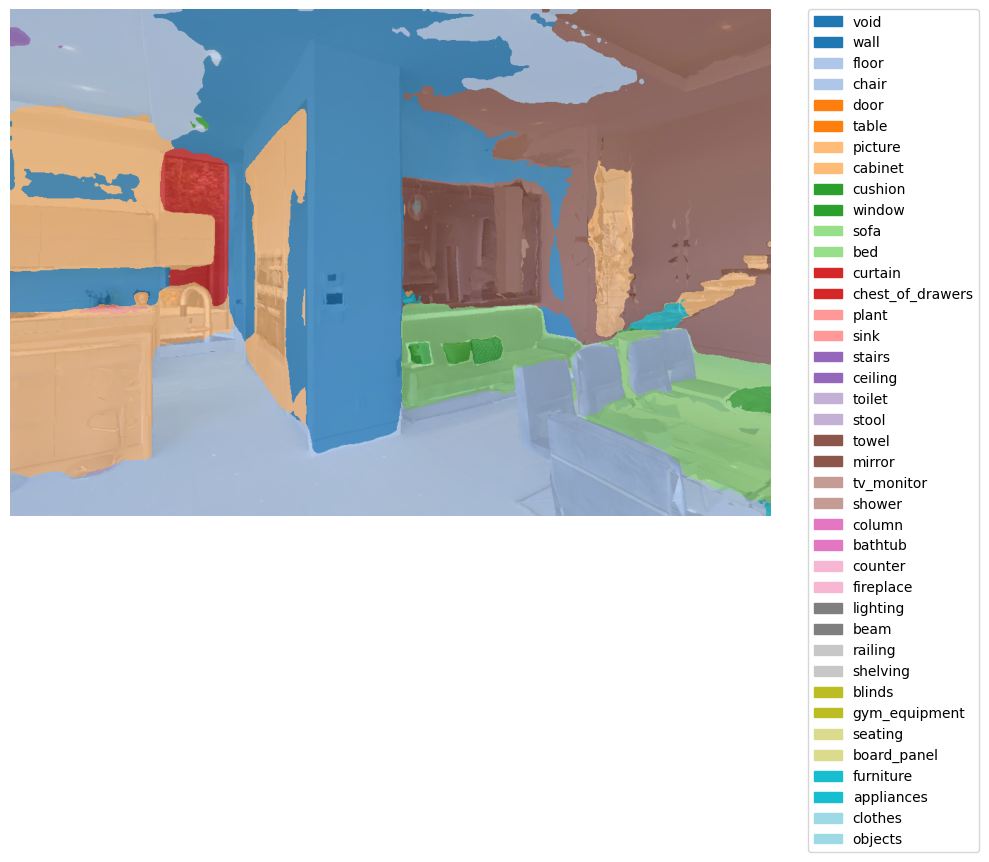

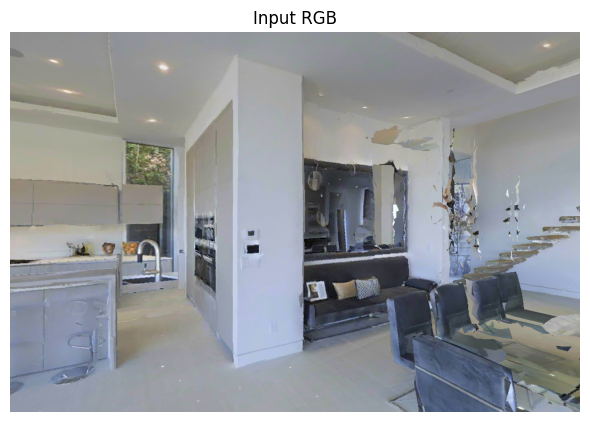

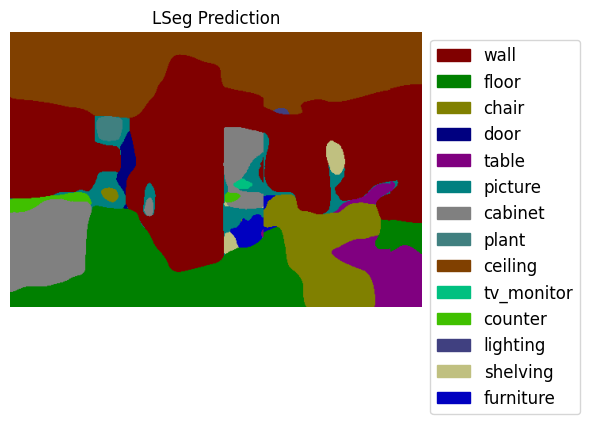

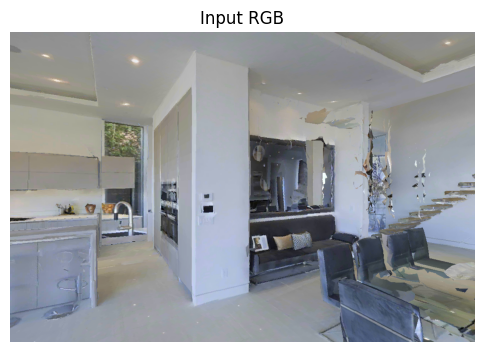

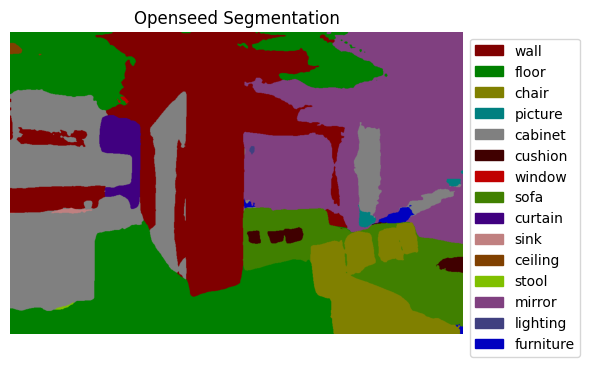


=== Embedding stats for OPENSEED ===
Spatial embedding: channels=512, height=128, width=192
  per‑channel mean: -0.0039 ± 0.3301
  per‑channel std : 0.4530 ± 0.1564


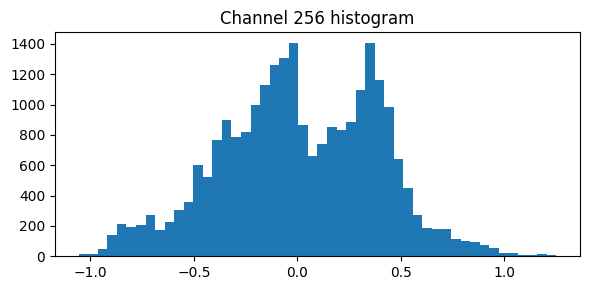

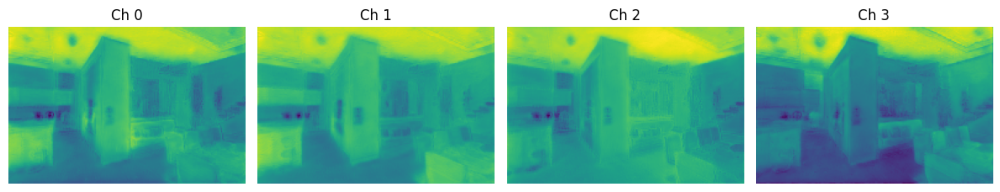


=== Embedding stats for LSEG ===
Spatial embedding: channels=512, height=347, width=520
  per‑channel mean: 0.0361 ± 0.5661
  per‑channel std : 0.2585 ± 0.0973


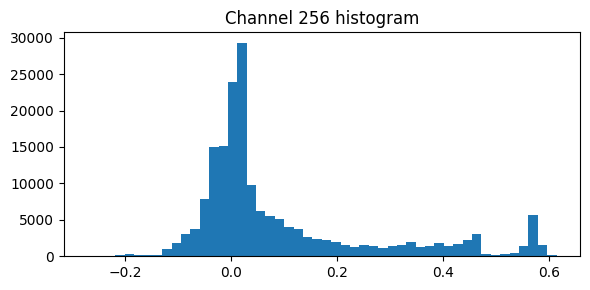

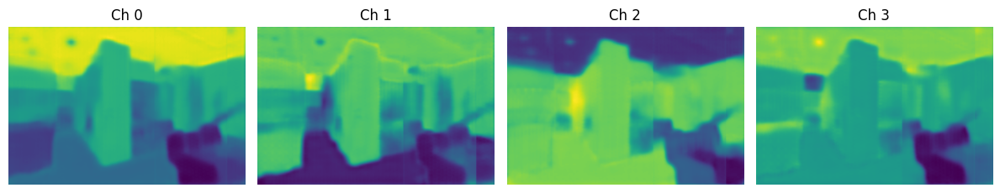

In [33]:
img_dir = "/home/jovyan/teaching_material/msc/MSc-Thesis/data/5LpN3gDmAk7_1/rgb/"
rgb, fname = load_rgb_image(img_dir, index=393)
print("Loaded:", fname)
outputs = segment_image(rgb, models, visualize=True)
plot_input_and_segmentation(rgb, outputs)
for name, (feats, seg_map, mask_img, patches) in outputs.items():
    print(f"\n=== Embedding stats for {name.upper()} ===")
    inspect_embeddings(feats, n_show=4)

# Individual VLM Evaluation

In [34]:
# — Notebook cell: simple modular Cityscapes benchmark — 
import os
from tqdm import tqdm
import numpy as np
from PIL import Image

## Download and Prepare Data (Cityscapes, NYU Depth V2, Pascal VOC 2012, Pascal-Context)

In [35]:
# Create Kaggle Account
# Go to Settings -> Create API Key
# mkdir -p ~/.kaggle
# mv ~/Downloads/kaggle.json ~/.kaggle/
# chmod 600 ~/.kaggle/kaggle.json

In [36]:
from kaggle import KaggleApi
# from kaggle.api.kaggle_api_extended import KaggleApi

In [37]:
cs_dir = os.path.join(root_dir, "data", "cityscapes")
if REPO_NEEDS_SETUP:
    os.makedirs(cs_dir, exist_ok=True)
    
    api = KaggleApi()
    api.authenticate()  # requires ~/.kaggle/kaggle.json
    
    # mirror (images + gtFine masks) from Kaggle
    # url: https://www.kaggle.com/datasets/sakshaymahna/cityscapes-depth-and-segmentation
    api.dataset_download_files(
        "sakshaymahna/cityscapes-depth-and-segmentation",
        path=cs_dir,
        unzip=True
    )
    print("✔️ Downloaded Cityscapes to:", cs_dir)

    
    # --- 2) NYU Depth V2 ---
    nyu_dir = os.path.join(root_dir, "data", "NYU-Depth-V2")
    os.makedirs(nyu_dir, exist_ok=True)
    api.dataset_download_files(
        "soumikrakshit/nyu-depth-v2",
        path=nyu_dir,
        unzip=True
    )
    print("✔️ Downloaded NYU Depth V2 to:", nyu_dir)


    # --- 3) Pascal VOC 2012 (with the 2007+2012 splits) ---
    voc_dir = os.path.join(root_dir, "data", "PascalVOC2012")
    os.makedirs(voc_dir, exist_ok=True)
    api.dataset_download_files(
        "vijayabhaskar96/pascal-voc-2007-and-2012",
        path=voc_dir,
        unzip=True
    )
    print("✔️ Downloaded Pascal VOC 2007+2012 to:", voc_dir)


    # --- 4) Pascal-Context ---
    import dataset_tools as dtools
    dtools.download(dataset='PASCAL Context', dst_dir=root_dir + "/data/PascalContext/")
    print("✔️ Downloaded Pascal-Context to:", pc_dir)

### Download segmentation labels (NYU Depth V2)

In [38]:
if REPO_NEEDS_SETUP:
    # url: https://cs.nyu.edu/~fergus/datasets/nyu_depth_v2.html
    !mkdir -p {root_dir}/data/NYU-Depth-V2/nyu_data/data/labels && \
     cd {root_dir}/data/NYU-Depth-V2/nyu_data/data/labels && \
     wget -q -O nyu_depth_v2_labeled.mat http://horatio.cs.nyu.edu/mit/silberman/nyu_depth_v2/nyu_depth_v2_labeled.mat && \
     ls -lh nyu_depth_v2_labeled.mat

### Check Dataset Segmentation Labels (NYU Depth V2)

In [39]:
import os
import mat73
import numpy as np
import matplotlib.pyplot as plt
import random

def visualize_nyu_v2_data(mat_file_path, num_samples=3):
    """
    Loads and visualizes RGB images, depth maps, and labels from the
    NYU Depth V2 .mat file.

    Args:
        mat_file_path (str): The full path to the 'nyu_depth_v2_labeled.mat' file.
        num_samples (int): The number of random samples to display.
    """
    # --- 1. Load the .mat file ---
    print(f"Loading data from: {mat_file_path}")
    if not os.path.exists(mat_file_path):
        print(f"Error: File not found at '{mat_file_path}'")
        print("Please make sure the path is correct.")
        return

    try:
        data = mat73.loadmat(mat_file_path)
    except Exception as e:
        print(f"An error occurred while loading the .mat file: {e}")
        return

    # --- 2. Extract the data arrays ---
    # The data is stored as (Height, Width, Channels, N) for images
    # and (Height, Width, N) for depth/labels.
    # We need to transpose them to (N, Height, Width, Channels) for easier slicing.
    images = np.transpose(data['images'], (3, 0, 1, 2))
    depths = np.transpose(data['depths'], (2, 0, 1))
    labels = np.transpose(data['labels'], (2, 0, 1))

    print(f"Successfully loaded:")
    print(f"- {images.shape[0]} RGB images of size {images.shape[1:]}")
    print(f"- {depths.shape[0]} depth maps of size {depths.shape[1:]}")
    print(f"- {labels.shape[0]} label masks of size {labels.shape[1:]}")

    # --- 3. Select random samples and plot ---
    total_images = images.shape[0]
    if total_images == 0:
        print("No images found in the file.")
        return
        
    sample_indices = random.sample(range(total_images), min(num_samples, total_images))

    for idx in sample_indices:
        # Get the data for the current index
        rgb_image = images[idx]
        depth_map = depths[idx]
        label_mask = labels[idx].astype(np.uint8)

        # Create a 3-panel figure
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        
        fig.suptitle(f"Sample Index: {idx}", fontsize=16)

        # Plot RGB Image
        axes[0].imshow(rgb_image)
        axes[0].set_title("RGB Image")
        axes[0].axis('off')

        # Plot Depth Map
        # Using a colormap to visualize depth (closer is typically darker)
        axes[1].imshow(depth_map, cmap='viridis')
        axes[1].set_title("Depth Map (meters)")
        axes[1].axis('off')

        # Plot Labels
        # Using a categorical colormap to show different classes
        axes[2].imshow(label_mask, cmap='tab20')
        axes[2].set_title("Semantic Labels")
        axes[2].axis('off')

        plt.tight_layout()
        plt.show()

Loading data from: /home/jovyan/teaching_material/msc/MSc-Thesis/data/NYU-Depth-V2/nyu_data/data/labels/nyu_depth_v2_labeled.mat


ERROR:root:ERROR: MATLAB type not supported: containers.Map, (uint32)


Successfully loaded:
- 1449 RGB images of size (480, 640, 3)
- 1449 depth maps of size (480, 640)
- 1449 label masks of size (480, 640)


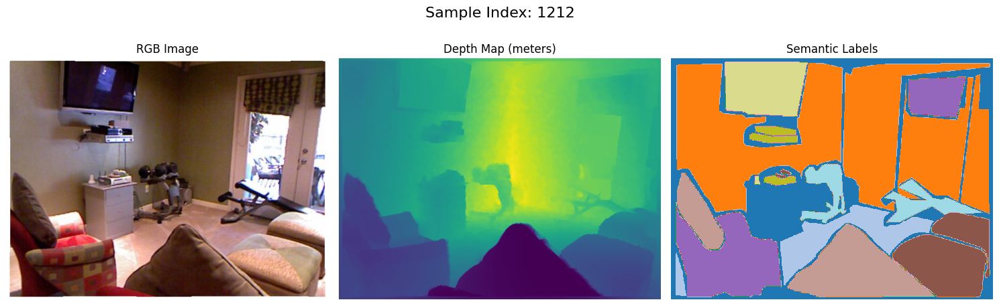

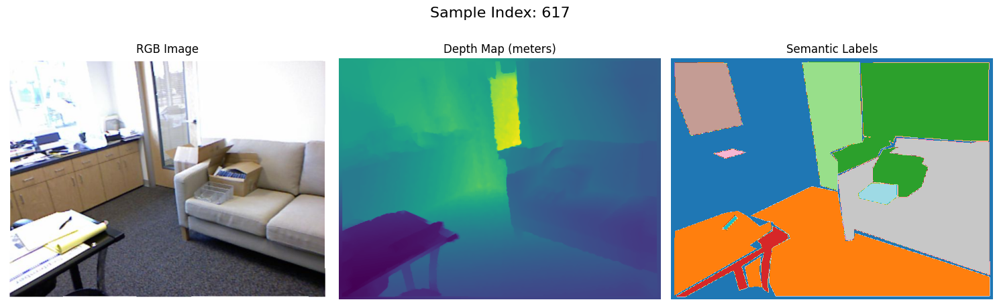

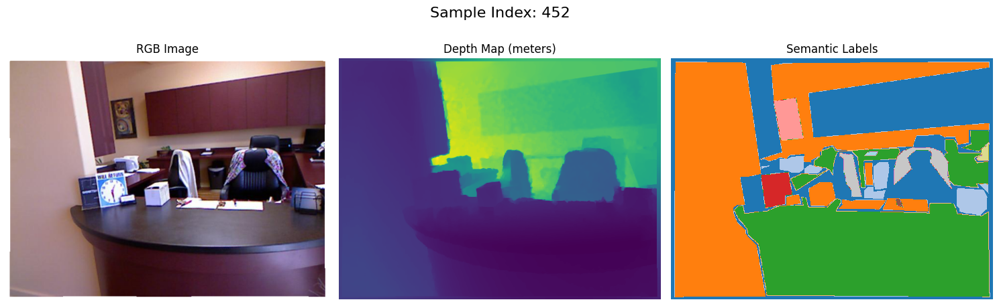

In [40]:
mat_path = os.path.join(
    root_dir,
    "data", "NYU-Depth-V2", "nyu_data", "data", "labels",
    "nyu_depth_v2_labeled.mat"
)

visualize_nyu_v2_data(mat_path, num_samples=3)

### Utility Functions

In [41]:
def compute_confusion(pred, gt, n_cls):
    mask = (gt >= 0) & (gt < n_cls) & (pred >= 0) & (pred < n_cls)
    idx  = n_cls * gt[mask] + pred[mask]
    return np.bincount(idx, minlength=n_cls*n_cls).reshape(n_cls, n_cls)

def evaluate(models, image_dir, gt_dir, n_cls, max_imgs=None, visualize=False):
    confs = {m: np.zeros((n_cls,n_cls),dtype=np.int64)
             for m in models["model_types"]}
    img_files = [f for f in os.listdir(image_dir) if f.endswith(".npy")]
    if max_imgs:
        img_files = img_files[:max_imgs]

    for fname in tqdm(img_files, desc=f"Evaluating {len(img_files)} images"):
        img_path = os.path.join(image_dir, fname)
        gt_path  = os.path.join(gt_dir,   fname)

        # 1) load & cast
        rgb = np.load(img_path)
        if rgb.dtype != np.uint8:
            if rgb.max() <= 1.0:
                rgb = (rgb * 255).clip(0,255).astype(np.uint8)
            else:
                rgb = rgb.astype(np.uint8)

        gt  = np.load(gt_path).astype(int)

        # 2) segment & accumulate
        outs = segment_image(rgb, models, visualize=visualize)
        for name, (_, seg_map, _, _) in outs.items():
            # — ensure shapes match before masking/indexing
            if seg_map.shape != gt.shape:
                seg_map = cv2.resize(
                    seg_map.astype(np.uint8),
                    (gt.shape[1], gt.shape[0]),
                    interpolation=cv2.INTER_NEAREST
                )
            confs[name] += compute_confusion(seg_map, gt, n_cls)

    # 3) report mIoU
    for name, C in confs.items():
        inter = np.diag(C)
        union = C.sum(1) + C.sum(0) - inter
        iou   = inter / (union + 1e-10)
        print(f"{name:>8} mIoU = {np.nanmean(iou):.4f}")
    return confs

In [42]:
import os
import mat73
import numpy as np
import cv2
from tqdm.notebook import tqdm # Use notebook-friendly tqdm
import warnings
import matplotlib.pyplot as plt
from PIL import Image
from matplotlib.patches import Patch
import random
import torch
import torchvision.transforms as transforms
import math
from typing import Dict, List, Tuple

# Suppress a common warning from mat73 for unsupported data types
warnings.filterwarnings("ignore", category=UserWarning, module='mat73')

# ==============================================================================
# 1. VISUALIZATION & METRICS CORE (Using your working functions)
# ==============================================================================

def get_new_pallete(num_cls):
    """Creates a color palette for visualizing segmentation masks."""
    n = num_cls
    pallete = [0] * (n * 3)
    for j in range(0, n):
        lab = j
        pallete[j * 3 + 0] = 0
        pallete[j * 3 + 1] = 0
        pallete[j * 3 + 2] = 0
        i = 0
        while lab > 0:
            pallete[j * 3 + 0] |= ((lab >> 0) & 1) << (7 - i)
            pallete[j * 3 + 1] |= ((lab >> 1) & 1) << (7 - i)
            pallete[j * 3 + 2] |= ((lab >> 2) & 1) << (7 - i)
            i = i + 1
            lab >>= 3
    return pallete

def get_new_mask_pallete(npimg, new_palette, labels=None, out_label_flag=False, ignore_ids_list=[]):
    """
    Generates a colored mask image and legend patches from a segmentation map.
    """
    out_img = Image.fromarray(npimg.squeeze().astype("uint8"))
    out_img.putpalette(new_palette)
    patches = []
    if out_label_flag and labels is not None:
        u_index = np.unique(npimg)
        for index in u_index:
            if index in ignore_ids_list:
                continue
            if 0 <= index < len(labels):
                label = labels[index]
                cur_color = [
                    new_palette[index * 3] / 255.0,
                    new_palette[index * 3 + 1] / 255.0,
                    new_palette[index * 3 + 2] / 255.0,
                ]
                patches.append(Patch(color=cur_color, label=label))
    return out_img, patches

def compute_confusion_matrix(pred, gt, n_cls):
    """Computes the confusion matrix for a single prediction-ground truth pair."""
    mask = (gt >= 0) & (gt < n_cls) & (pred >= 0) & (pred < n_cls)
    index = n_cls * gt[mask] + pred[mask]
    return np.bincount(index, minlength=n_cls*n_cls).reshape(n_cls, n_cls)

def compute_metrics(confusion_matrix):
    """Computes mIoU, overall accuracy, and per-class IoU from a confusion matrix."""
    inter = np.diag(confusion_matrix)
    union = confusion_matrix.sum(axis=1) + confusion_matrix.sum(axis=0) - inter
    iou = inter / (union + 1e-10)
    mean_iou = np.nanmean(iou)
    accuracy = inter.sum() / (confusion_matrix.sum() + 1e-10)
    return mean_iou, accuracy, iou

# ==============================================================================
# 2. CORRECTED MODEL INFERENCE
# ==============================================================================

def get_lseg_feat_corrected(model: LSegEncNet, image: np.array, labels, transform, crop_size=480,
                 base_size=520, norm_mean=[0.5, 0.5, 0.5], norm_std=[0.5, 0.5, 0.5], vis=False):
    """
    This is your original get_lseg_feat function, but corrected to return
    both the raw features and the final prediction map.
    """
    # This function body is copied directly from your provided notebook code
    vis_image = image.copy()
    image = transform(image).unsqueeze(0).cuda()
    batch, _, h, w = image.size()
    stride_rate = 2.0/3.0
    stride = int(crop_size * stride_rate)
    long_size = base_size
    if h > w:
        height = long_size
        width = int(1.0 * w * long_size / h + 0.5)
        short_size = width
    else:
        width = long_size
        height = int(1.0 * h * long_size / w + 0.5)
        short_size = height
    cur_img = resize_image(image, height, width, **{'mode': 'bilinear', 'align_corners': True})
    if long_size <= crop_size:
        pad_img = pad_image(cur_img, norm_mean, norm_std, crop_size)
        with torch.no_grad():
            outputs, logits = model(pad_img, labels)
        outputs = crop_image(outputs, 0, height, 0, width)
        logits_outputs = crop_image(logits, 0, height, 0, width)
    else:
        if short_size < crop_size:
            pad_img = pad_image(cur_img, norm_mean, norm_std, crop_size)
        else:
            pad_img = cur_img
        _,_,ph,pw = pad_img.shape
        assert(ph >= height and pw >= width)
        h_grids = int(math.ceil(1.0 * (ph-crop_size)/stride)) + 1
        w_grids = int(math.ceil(1.0 * (pw-crop_size)/stride)) + 1
        with torch.cuda.device_of(image):
            with torch.no_grad():
                outputs = image.new().resize_(batch, model.out_c,ph,pw).zero_().cuda()
                logits_outputs = image.new().resize_(batch, len(labels),ph,pw).zero_().cuda()
                count_norm = image.new().resize_(batch,1,ph,pw).zero_().cuda()
            for idh in range(h_grids):
                for idw in range(w_grids):
                    h0 = idh * stride
                    w0 = idw * stride
                    h1 = min(h0 + crop_size, ph)
                    w1 = min(w0 + crop_size, pw)
                    crop_img = crop_image(pad_img, h0, h1, w0, w1)
                    pad_crop_img = pad_image(crop_img, norm_mean, norm_std, crop_size)
                    with torch.no_grad():
                        mask_preds, logit_preds = model(pad_crop_img.to(device), labels)
                    outputs[:,:,h0:h1,w0:w1] += crop_image(mask_preds, 0, h1-h0, 0, w1-w0)
                    logits_outputs[:,:,h0:h1,w0:w1] += crop_image(logit_preds, 0, h1-h0, 0, w1-w0)
                    count_norm[:,:,h0:h1,w0:w1] += 1
            assert((count_norm==0).sum()==0)
            outputs = outputs / count_norm
            logits_outputs = logits_outputs / count_norm
            outputs = outputs[:,:,:height,:width]
            logits_outputs = logits_outputs[:,:,:height,:width]
    
    # This is the final prediction map calculated inside the function
    predicts = [torch.max(logit, 0)[1].cpu().numpy() for logit in logits_outputs]
    pred = predicts[0]
    
    # --- FIX: Return both the raw features AND the final prediction map ---
    return outputs.cpu().numpy(), pred


def segment_image_corrected(rgb: np.ndarray, models: Dict, long_edge: int = 512, crop_size: int = 480, base_size: int = 520, visualize: bool = False) -> Dict[str, Tuple]:
    """
    Corrected wrapper that uses the right return value from get_lseg_feat_corrected.
    """
    seg_classes = models["seg_classes"]
    outputs = {}

    if "openseed" in models["model_types"]:
        # get_openseed_feat is assumed to be defined in the notebook and working correctly
        feats, seg_map, mask_img, patches = get_openseed_feat(
            models["openseed_model"], rgb, seg_classes, visualize=visualize
        )
        outputs["openseed"] = (feats, seg_map, mask_img, patches)

    if "lseg" in models["model_types"]:
        # --- FIX: Use the corrected LSeg function and unpack both return values ---
        lseg_feats_raw, lseg_seg_map = get_lseg_feat_corrected(
            models["lseg_model"],
            rgb,
            seg_classes,
            transform=transforms.Compose([
                transforms.ToTensor(),
                transforms.Normalize([0.5]*3, [0.5]*3)
            ]),
            crop_size=crop_size,
            base_size=base_size,
            vis=visualize # Note: The internal visualizer of get_lseg_feat will now show the correct map
        )
        # --- FIX: Use the returned seg_map directly, don't recalculate it ---
        outputs["lseg"] = (lseg_feats_raw[0], lseg_seg_map, None, None)
        
    return outputs

# ==============================================================================
# 3. NYU-DEPTH-V2 SPECIFIC FUNCTIONS
# ==============================================================================

def load_nyu_v2_data(mat_file_path):
    """Loads images and labels from the NYUv2 .mat file, skipping depth maps."""
    print(f"Loading NYUv2 data from: {mat_file_path}")
    if not os.path.exists(mat_file_path):
        raise FileNotFoundError(f"File not found at '{mat_file_path}'")
    data = mat73.loadmat(mat_file_path)
    images = np.transpose(data['images'], (3, 0, 1, 2))
    labels = np.transpose(data['labels'], (2, 0, 1)).astype(int)
    print(f"Successfully loaded {images.shape[0]} images and labels.")
    return images, labels

def visualize_nyu_v2_predictions(models, images, labels, class_names, num_samples=3):
    """Visualizes model predictions against ground truth for NYUv2."""
    print("\n--- Visualizing Predictions ---")
    palette = get_new_pallete(len(class_names))
    indices_to_show = random.sample(range(len(images)), num_samples)
    
    for idx in indices_to_show:
        rgb = images[idx]
        gt_label = labels[idx]
        
        # Use the corrected segmentation function
        predictions = segment_image_corrected(rgb, models)
        
        num_plots = 2 + len(predictions)
        fig, axes = plt.subplots(1, num_plots, figsize=(7 * num_plots, 6))
        fig.suptitle(f"Sample Index: {idx}", fontsize=16)

        axes[0].imshow(rgb)
        axes[0].set_title("Input RGB")
        axes[0].axis('off')

        gt_mask_img, gt_patches = get_new_mask_pallete(gt_label, palette, out_label_flag=True, labels=class_names)
        axes[1].imshow(gt_mask_img)
        axes[1].set_title("Ground Truth")
        axes[1].axis('off')
        axes[1].legend(handles=gt_patches, loc="upper left", bbox_to_anchor=(1.02, 1), prop={"size": 10})

        plot_idx = 2
        for model_name, (_, pred_map, _, _) in predictions.items():
            if pred_map is not None:
                pred_mask_img, pred_patches = get_new_mask_pallete(pred_map, palette, out_label_flag=True, labels=class_names)
                axes[plot_idx].imshow(pred_mask_img)
                axes[plot_idx].legend(handles=pred_patches, loc="upper left", bbox_to_anchor=(1.02, 1), prop={"size": 10})
            
            axes[plot_idx].set_title(f"{model_name.title()} Prediction")
            axes[plot_idx].axis('off')
            plot_idx += 1
            
        plt.tight_layout(rect=[0, 0, 0.9, 1])
        plt.show()

def evaluate_on_nyu_v2(models, all_images, all_labels, n_cls, max_imgs=None, visualize=False):
    """Evaluation loop for NYUv2."""
    conf_matrices = {m: np.zeros((n_cls, n_cls), dtype=np.int64) for m in models["model_types"]}
    num_images_to_eval = min(max_imgs, len(all_images)) if max_imgs else len(all_images)
    
    print(f"\nEvaluating on {num_images_to_eval} images from NYU Depth V2...")
    for i in tqdm(range(num_images_to_eval), desc="NYUv2 Evaluation"):
        rgb = all_images[i]
        gt = all_labels[i]

        # Use the corrected segmentation function
        predictions = segment_image_corrected(rgb, models, visualize=visualize)
        
        for model_name, (_, pred_map, _, _) in predictions.items():
            if pred_map is not None:
                if pred_map.shape != gt.shape:
                    pred_map = cv2.resize(pred_map.astype(np.uint8), (gt.shape[1], gt.shape[0]), interpolation=cv2.INTER_NEAREST)
                conf_matrices[model_name] += compute_confusion_matrix(pred_map, gt, n_cls)
        
        if torch.cuda.is_available():
            torch.cuda.empty_cache()
            
    print("\n--- Evaluation Results ---")
    for model_name, conf_matrix in conf_matrices.items():
        mIoU, acc, _ = compute_metrics(conf_matrix)
        print(f"Model: {model_name}")
        print(f"  - mIoU: {mIoU:.4f}")
        print(f"  - Overall Accuracy: {acc:.4f}")
    
    return conf_matrices

### Individual VLMs Evaluation Settings

In [43]:
CITY_ROOT  = cs_dir
SPLIT      = "val"
IMAGE_DIR  = os.path.join(CITY_ROOT, "data", SPLIT, "image")
GT_DIR     = os.path.join(CITY_ROOT, "data", SPLIT, "label")
MAX_IMAGES = 50 # None => all
segmentation_classes = [
    "road","sidewalk","building","wall","fence",
    "pole","traffic light","traffic sign","vegetation",
    "terrain","sky","person","rider","car","truck",
    "bus","train","motorcycle","bicycle"
]

In [44]:
nyu_mat_path = os.path.join(
        root_dir, "data", "NYU-Depth-V2", "nyu_data", "data", "labels",
        "nyu_depth_v2_labeled.mat"
    )

NYU_40_CLASSES = [
    'wall', 'floor', 'cabinet', 'bed', 'chair', 'sofa', 'table', 'door',
    'window', 'bookshelf', 'picture', 'counter', 'blinds', 'desk', 'shelves',
    'curtain', 'dresser', 'pillow', 'mirror', 'floor mat', 'clothes',
    'ceiling', 'books', 'refrigerator', 'television', 'paper', 'towel',
    'shower curtain', 'box', 'whiteboard', 'person', 'nightstand', 'toilet',
    'sink', 'lamp', 'bathtub', 'bag', 'otherstructure', 'otherfurniture',
    'otherprop'
]

### Run Individual VLMs Evaluation

#### NYU Depth V2 Dataset

Loading OpenSeeD model with new loader…
self.task_switch  {'coco': True, 'o365': True}


Loading CLIP ViT-B/32 + LSeg encoder…
Loading NYUv2 data from: /home/jovyan/teaching_material/msc/MSc-Thesis/data/NYU-Depth-V2/nyu_data/data/labels/nyu_depth_v2_labeled.mat


ERROR:root:ERROR: MATLAB type not supported: containers.Map, (uint32)


Successfully loaded 1449 images and labels.

--- Visualizing Predictions ---


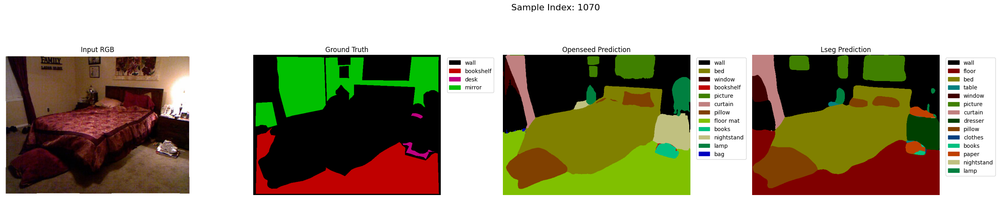

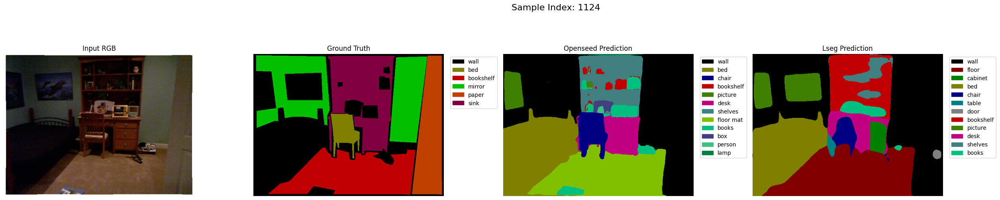

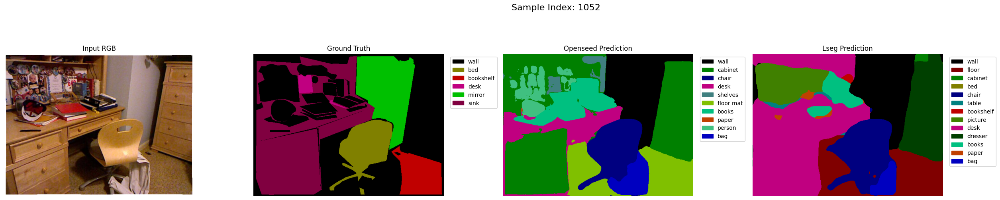

An unexpected error occurred: name 'NUM_CLASSES' is not defined


In [45]:
models_for_nyu = initialize_models(
    CFG_FILE, 
    WGT_FILE,
    segmentation_classes=NYU_40_CLASSES,
    model_types=["lseg", "openseed"],
    lseg_ckpt_path=os.path.join(root_dir, "lseg/checkpoints/demo_e200.ckpt"),
    device=device
)

try:
    images, raw_labels = load_nyu_v2_data(nyu_mat_path)
    
    nyu_40_mapping = np.array([-1,0,1,2,3,4,5,6,7,8,9,10,11,12,13,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39] + [-1]*852)
    mapped_labels = np.zeros_like(raw_labels)
    valid_mask = raw_labels > 0
    zero_based_indices = raw_labels[valid_mask] - 1
    mapped_values = nyu_40_mapping[zero_based_indices]
    mapped_labels[valid_mask] = mapped_values
    mapped_labels[mapped_labels == -1] = 0

    # --- Step 3: Visualize some results to debug ---
    visualize_nyu_v2_predictions(
        models=models_for_nyu,
        images=images,
        labels=mapped_labels,
        class_names=NYU_40_CLASSES,
        num_samples=3
    )

    # --- Step 4: Run the Full Evaluation ---
    conf_mats = evaluate_on_nyu_v2(
        models=models_for_nyu,
        all_images=images,
        all_labels=mapped_labels,
        n_cls=NUM_CLASSES,
        max_imgs=MAX_IMAGES_TO_EVAL
    )
    
except FileNotFoundError as e:
    print(e)
except Exception as e:
    print(f"An unexpected error occurred: {e}")

#### Cityscapes Dataset

In [46]:
models = initialize_models(
    CFG_FILE,
    WGT_FILE,
    segmentation_classes=segmentation_classes,
    model_types=["lseg", "openseed"],
    lseg_ckpt_path=os.path.join(root_dir, "lseg", "checkpoints", "demo_e200.ckpt"),
    device="cuda"
)

Loading OpenSeeD model with new loader…
self.task_switch  {'coco': True, 'o365': True}


Loading CLIP ViT-B/32 + LSeg encoder…


In [47]:
conf_mats = evaluate(models, IMAGE_DIR, GT_DIR, len(segmentation_classes), max_imgs=MAX_IMAGES, visualize=False)

Evaluating 50 images:   0%|          | 0/50 [00:00<?, ?it/s]

    lseg mIoU = 0.0132
openseed mIoU = 0.3458


#### Pascal Context

Scanning for image-annotation pairs in /home/jovyan/teaching_material/msc/MSc-Thesis/data/PascalContext/pascal-context/val/img...
Found 5105 image/annotation pairs for the 'val' split.
Loading OpenSeeD model with new loader…
self.task_switch  {'coco': True, 'o365': True}


Loading CLIP ViT-B/32 + LSeg encoder…

--- Visualizing 3 Random Predictions ---


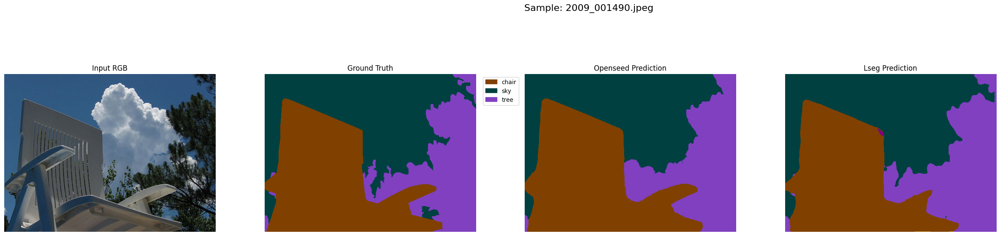

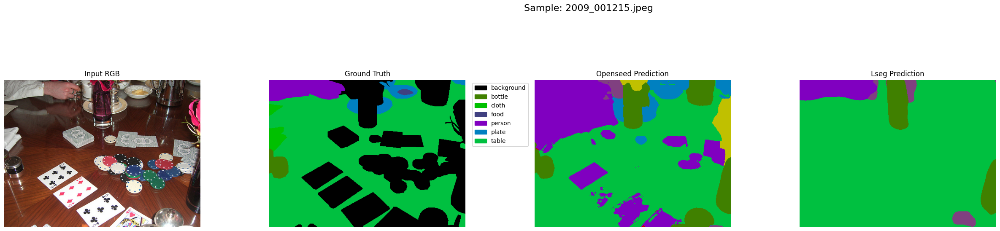

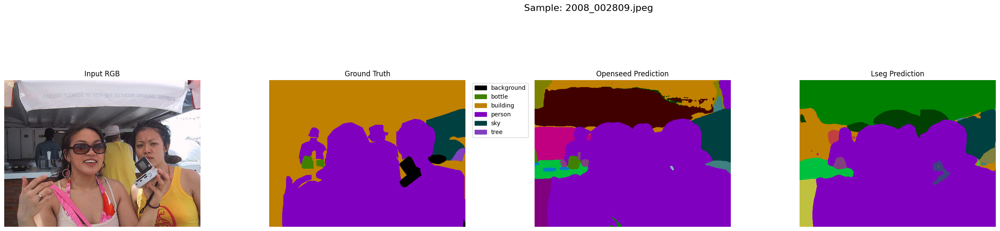


--- Starting Evaluation on 100 Pascal-Context Images ---


Pascal-Context Eval:   0%|          | 0/100 [00:00<?, ?it/s]


--- Pascal-Context Evaluation Results ---

Model: LSEG
  - Mean IoU (mIoU): 0.4005
  - Overall Accuracy: 0.7390

Model: OPENSEED
  - Mean IoU (mIoU): 0.3880
  - Overall Accuracy: 0.6878


In [48]:
import os
import json
import numpy as np
import cv2
from PIL import Image
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import random
import warnings
from typing import List, Tuple, Dict
import base64
import zlib  # <-- Required for decompression

# ==============================================================================
# 1. DATASET HELPERS (FINALIZED FOR ZLIB + BITMAP ANNOTATIONS)
# ==============================================================================

PASCAL_CONTEXT_59_CLASSES: List[str] = [
    'aeroplane', 'bag', 'bed', 'bedclothes', 'bench', 'bicycle', 'bird', 'boat',
    'book', 'bottle', 'building', 'bus', 'cabinet', 'car', 'cat', 'ceiling',
    'chair', 'cloth', 'computer', 'cow', 'cup', 'curtain', 'dog', 'door',
    'fence', 'floor', 'flower', 'food', 'grass', 'ground', 'horse', 'keyboard',
    'light', 'motorbike', 'mountain', 'mouse', 'person', 'plate', 'platform',
    'plant', 'road', 'rock', 'sheep', 'shelf', 'ship', 'sidewalk', 'sign',
    'sky', 'sofa', 'table', 'track', 'train', 'tree', 'truck', 'tv', 'water',
    'wall', 'window', 'wood'
]

CLASS_NAME_TO_ID: Dict[str, int] = {name: i for i, name in enumerate(PASCAL_CONTEXT_59_CLASSES)}

def get_pascal_context_split_from_json(pc_root: str, split: str = 'val') -> List[Tuple[str, str]]:
    """Gets file paths for a data split where annotations are in JSON format."""
    img_dir = os.path.join(pc_root, split, 'img')
    ann_dir = os.path.join(pc_root, split, 'ann')
    if not os.path.isdir(img_dir): raise FileNotFoundError(f"Image directory not found: {img_dir}")
    data_list: List[Tuple[str, str]] = []
    print(f"Scanning for image-annotation pairs in {img_dir}...")
    for img_filename in sorted(os.listdir(img_dir)):
        if img_filename.lower().endswith(('.png', '.jpg', '.jpeg')):
            ann_filename = f"{img_filename}.json"
            img_path = os.path.join(img_dir, img_filename)
            ann_path = os.path.join(ann_dir, ann_filename)
            if os.path.exists(ann_path):
                data_list.append((img_path, ann_path))
    print(f"Found {len(data_list)} image/annotation pairs for the '{split}' split.")
    return data_list

def load_gt_mask_from_bitmap_json(json_path: str, height: int, width: int, class_map: Dict[str, int]) -> np.ndarray:
    """
    [FINAL VERSION] Loads annotations by decoding base64, decompressing zlib, and rendering the bitmap.
    """
    full_mask = np.zeros((height, width), dtype=np.int64)
    try:
        with open(json_path, 'r') as f:
            data = json.load(f)
    except Exception as e:
        return full_mask

    for obj in data.get('objects', []):
        if obj.get("geometryType") != "bitmap": continue
        class_title_raw = obj.get("classTitle");
        if not class_title_raw: continue
        class_title = class_title_raw.lower()

        if class_title in class_map:
            class_id = class_map[class_title]
            bitmap_data = obj.get("bitmap", {})
            b64_encoded = bitmap_data.get("data")
            origin = bitmap_data.get("origin")
            if not b64_encoded or not origin: continue

            try:
                decoded_bytes = base64.b64decode(b64_encoded)
                # --- NEW ZLIB DECOMPRESSION STEP ---
                decompressed_bytes = zlib.decompress(decoded_bytes)
                
                np_arr = np.frombuffer(decompressed_bytes, np.uint8)
                small_mask = cv2.imdecode(np_arr, cv2.IMREAD_UNCHANGED)
                if small_mask is None: continue
                
                if len(small_mask.shape) == 3:
                    bool_mask = (small_mask[:, :, 3] > 0) if small_mask.shape[2] == 4 else (cv2.cvtColor(small_mask, cv2.COLOR_BGR2GRAY) > 0)
                else:
                    bool_mask = small_mask > 0
                
                h_s, w_s = bool_mask.shape
                x1, y1 = origin
                y2, x2 = y1 + h_s, x1 + w_s
                if y2 > height or x2 > width: continue
                full_mask[y1:y2, x1:x2][bool_mask] = class_id + 1
            except Exception:
                continue
    return full_mask

# ==============================================================================
# 2. VISUALIZATION & EVALUATION (Full Script)
# ==============================================================================
# Re-including all necessary functions so this cell can be run on its own after the models are initialized.

def get_new_pallete(num_cls):
    n = num_cls; pallete = [0] * (n * 3)
    for j in range(0, n):
        lab = j; pallete[j * 3 + 0] = 0; pallete[j * 3 + 1] = 0; pallete[j * 3 + 2] = 0; i = 0
        while lab > 0:
            pallete[j * 3 + 0] |= (((lab >> 0) & 1) << (7 - i)); pallete[j * 3 + 1] |= (((lab >> 1) & 1) << (7 - i)); pallete[j * 3 + 2] |= (((lab >> 2) & 1) << (7 - i));
            i = i + 1; lab >>= 3;
    return pallete

def get_new_mask_pallete(npimg, new_palette, labels=None, out_label_flag=False):
    out_img = Image.fromarray(npimg.squeeze().astype("uint8")).convert("P"); out_img.putpalette(new_palette)
    patches = []
    if out_label_flag and labels is not None:
        for index in np.unique(npimg):
            if 0 <= index < len(labels):
                label = labels[index]; cur_color = [new_palette[index * 3]/255.0, new_palette[index * 3 + 1]/255.0, new_palette[index * 3 + 2]/255.0]
                patches.append(Patch(color=cur_color, label=label))
    return out_img, patches

def visualize_and_evaluate(models: Dict, data_list: List[Tuple[str, str]], class_names: List[str], max_imgs_eval: int, num_to_viz: int):
    """Combines visualization and evaluation."""
    # --- Visualization ---
    if num_to_viz > 0:
        print(f"\n--- Visualizing {num_to_viz} Random Predictions ---")
        vis_class_names = ['background'] + class_names; palette = get_new_pallete(len(vis_class_names))
        sample_indices = random.sample(range(len(data_list)), min(num_to_viz, len(data_list)))
        for idx in sample_indices:
            img_path, ann_path = data_list[idx]
            rgb = np.array(Image.open(img_path).convert("RGB")); h, w, _ = rgb.shape
            gt_raw = load_gt_mask_from_bitmap_json(ann_path, h, w, CLASS_NAME_TO_ID)
            predictions = segment_image_corrected(rgb, models)
            fig, axes = plt.subplots(1, 2 + len(predictions), figsize=(7 * (2 + len(predictions)), 7)); fig.suptitle(f"Sample: {os.path.basename(img_path)}", fontsize=16)
            axes[0].imshow(rgb); axes[0].set_title("Input RGB"); axes[0].axis('off')
            gt_mask_img, gt_patches = get_new_mask_pallete(gt_raw, palette, out_label_flag=True, labels=vis_class_names)
            axes[1].imshow(gt_mask_img); axes[1].set_title("Ground Truth"); axes[1].axis('off')
            for i, (name, (feats, seg_map, _, _)) in enumerate(predictions.items()):
                if seg_map is not None:
                    pred_viz = seg_map + 1; pred_mask_img, _ = get_new_mask_pallete(pred_viz, palette, out_label_flag=False)
                    axes[i+2].imshow(pred_mask_img); axes[i+2].set_title(f"{name.title()} Prediction"); axes[i+2].axis('off')
            axes[1].legend(handles=gt_patches, loc="upper left", bbox_to_anchor=(1.02, 1)); plt.tight_layout(rect=[0, 0, 0.85, 1]); plt.show()

    # --- Evaluation ---
    evaluate_on_pascal_context(models, data_list, class_names, max_imgs=max_imgs_eval)

def evaluate_on_pascal_context(models: Dict, data_list: List[Tuple[str, str]], class_names: List[str], max_imgs: int = None):
    n_cls = len(class_names); conf_matrices = {m: np.zeros((n_cls, n_cls), dtype=np.int64) for m in models["model_types"]}
    num_to_eval = min(max_imgs, len(data_list)) if max_imgs is not None else len(data_list)
    print(f"\n--- Starting Evaluation on {num_to_eval} Pascal-Context Images ---")
    for img_path, ann_path in tqdm(data_list[:num_to_eval], desc="Pascal-Context Eval"):
        rgb = np.array(Image.open(img_path).convert("RGB")); h, w, _ = rgb.shape
        gt_raw = load_gt_mask_from_bitmap_json(ann_path, h, w, CLASS_NAME_TO_ID); gt_mapped = gt_raw - 1
        predictions = segment_image_corrected(rgb, models)
        for name, (_, pred_map, _, _) in predictions.items():
            if pred_map is not None:
                if pred_map.shape != gt_mapped.shape: pred_map = cv2.resize(pred_map.astype(np.uint8), (gt_mapped.shape[1], gt_mapped.shape[0]), interpolation=cv2.INTER_NEAREST)
                conf_matrices[name] += compute_confusion_matrix(pred_map, gt_mapped, n_cls)
    print("\n--- Pascal-Context Evaluation Results ---")
    for name, conf_matrix in conf_matrices.items():
        mIoU, acc, _ = compute_metrics(conf_matrix)
        print(f"\nModel: {name.upper()}\n  - Mean IoU (mIoU): {mIoU:.4f}\n  - Overall Accuracy: {acc:.4f}")

# ==============================================================================
# 3. MAIN EXECUTION BLOCK
# ==============================================================================
try:
    PC_ROOT = os.path.join(root_dir, "data", "PascalContext", "pascal-context")
    data_list = get_pascal_context_split_from_json(PC_ROOT, split='val')
    if data_list:
        models_for_pc = initialize_models(CFG_FILE, WGT_FILE, segmentation_classes=PASCAL_CONTEXT_59_CLASSES, model_types=["lseg", "openseed"], lseg_ckpt_path=os.path.join(root_dir, "lseg/checkpoints/demo_e200.ckpt"), device=device)
        visualize_and_evaluate(models_for_pc, data_list, PASCAL_CONTEXT_59_CLASSES, max_imgs_eval=100, num_to_viz=3)
except Exception as e:
    print(f"\nAn error occurred: {e}"); import traceback; traceback.print_exc()

#### Pascal VOC 2012 Dataset

Using 20-class set for PASCAL VOC 2012.
Found 1449 image/mask pairs for the VOC 2012 'val' split.

Initializing models for PASCAL VOC 2012...
Loading OpenSeeD model with new loader…
self.task_switch  {'coco': True, 'o365': True}


Loading CLIP ViT-B/32 + LSeg encoder…

--- Visualizing 3 Random PASCAL VOC 2012 Predictions ---


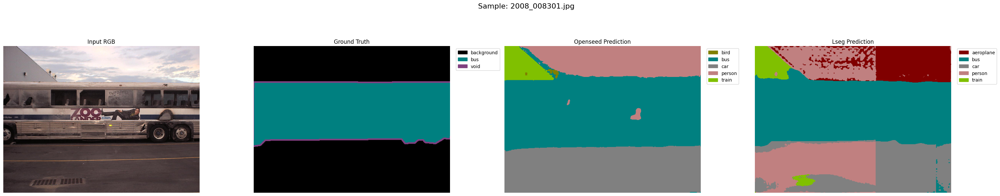

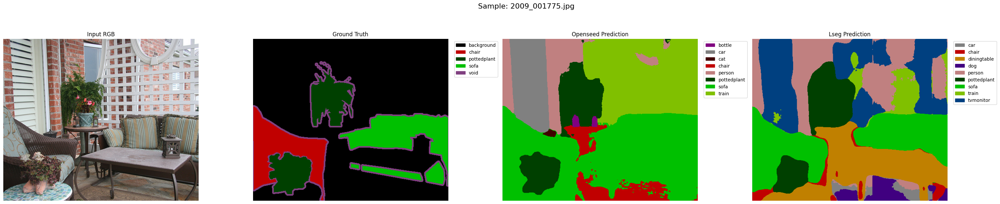

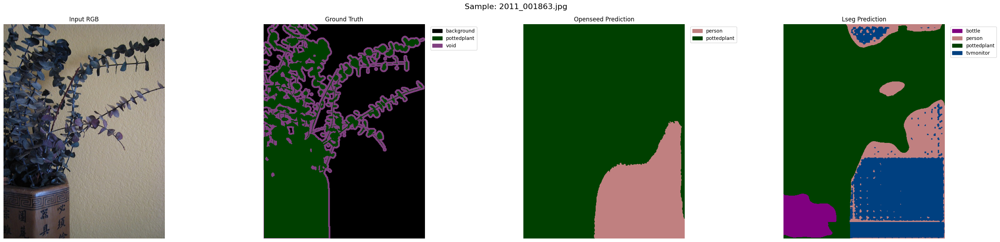


--- Starting Evaluation on 100 PASCAL VOC 2012 Images ---


PASCAL VOC 2012 Eval:   0%|          | 0/100 [00:00<?, ?it/s]


--- PASCAL VOC 2012 Evaluation Results ---

Model: LSEG
  - Mean IoU (mIoU): 0.9136
  - Overall Accuracy: 0.9736

Model: OPENSEED
  - Mean IoU (mIoU): 0.8531
  - Overall Accuracy: 0.9533


In [49]:
# ==============================================================================
# 0. IMPORTS (Assumed to be loaded from previous cells)
# ==============================================================================
# All necessary imports like os, numpy, cv2, Image, tqdm, etc. are assumed to be available.
from PIL import Image
from typing import Dict, List, Tuple

# ==============================================================================
# 1. PASCAL VOC 2012 CONFIGURATION
# ==============================================================================

# --- NEW FOR VOC 2012 ---
# Assumes you unzipped the download into 'data/PascalVOC2012'
VOC_ROOT = os.path.join(root_dir, "data", "PascalVOC2012", "VOCdevkit", "VOC2012")

# --- NEW FOR VOC 2012 ---
# The 20 standard object classes for PASCAL VOC
PASCAL_VOC_20_CLASSES = [
    'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat',
    'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person',
    'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor'
]


# ==============================================================================
# 2. NEW DATA HELPERS FOR PASCAL VOC 2012
# ==============================================================================

def get_voc_split(voc_root: str, split: str = 'val') -> List[Tuple[str, str]]:
    """
    --- NEW FOR VOC 2012 ---
    Gets the file paths for the VOC 2012 validation split.
    """
    split_file = os.path.join(voc_root, 'ImageSets', 'Segmentation', f'{split}.txt')
    if not os.path.exists(split_file):
        raise FileNotFoundError(f"VOC split file not found: {split_file}")

    with open(split_file, 'r') as f:
        basenames = [line.strip() for line in f]

    data_list = []
    for bn in basenames:
        img_path = os.path.join(voc_root, 'JPEGImages', f'{bn}.jpg')
        # Masks are .png files in the SegmentationClass folder
        gt_path = os.path.join(voc_root, 'SegmentationClass', f'{bn}.png')
        if os.path.exists(img_path) and os.path.exists(gt_path):
            data_list.append((img_path, gt_path))

    print(f"Found {len(data_list)} image/mask pairs for the VOC 2012 '{split}' split.")
    return data_list


def load_voc_gt_mask(png_path: str) -> np.ndarray:
    """
    --- NEW FOR VOC 2012 ---
    Loads a ground truth mask from a .png file.
    """
    # Masks are saved as palette-based PNGs, so open and convert to numpy array
    return np.array(Image.open(png_path), dtype=np.int64)


# ==============================================================================
# 3. GENERIC VISUALIZATION & EVALUATION (Adapted for VOC 2012)
# ==============================================================================

def visualize_voc_predictions(models, data_list: List[Tuple[str, str]], class_names: List[str], num_samples: int = 3):
    """
    --- MODIFIED FOR VOC 2012 ---
    Visualizes model predictions against ground truth for VOC 2012.
    """
    print(f"\n--- Visualizing {num_samples} Random PASCAL VOC 2012 Predictions ---")
    # For visualization, we include background (0) and void (255) in the palette if needed
    vis_class_names = ['background'] + class_names + ['void']
    palette = get_new_pallete(len(vis_class_names))

    indices_to_show = random.sample(range(len(data_list)), num_samples)

    for idx in indices_to_show:
        img_path, gt_path = data_list[idx]
        rgb = np.array(Image.open(img_path).convert("RGB"))
        gt_raw = load_voc_gt_mask(gt_path)

        # For visualization, we can show the raw mask with its original labels
        gt_for_vis = gt_raw.copy()
        # Map the void color to a specific index if needed for legend
        gt_for_vis[gt_for_vis == 255] = len(class_names) + 1 # Map void to the last index

        predictions = segment_image_corrected(rgb, models)

        num_plots = 2 + len(predictions)
        fig, axes = plt.subplots(1, num_plots, figsize=(8 * num_plots, 7))
        fig.suptitle(f"Sample: {os.path.basename(img_path)}", fontsize=16)

        # Plot RGB and Ground Truth
        axes[0].imshow(rgb)
        axes[0].set_title("Input RGB")
        axes[0].axis('off')
        gt_mask_img, gt_patches = get_new_mask_pallete(gt_for_vis, palette, out_label_flag=True, labels=vis_class_names)
        axes[1].imshow(gt_mask_img)
        axes[1].set_title("Ground Truth")
        axes[1].axis('off')
        axes[1].legend(handles=gt_patches, loc="upper left", bbox_to_anchor=(1.02, 1), prop={"size": 10})

        # Plot Predictions
        plot_idx = 2
        for model_name, (_, pred_map, _, _) in predictions.items():
            ax = axes[plot_idx]
            if pred_map is not None:
                # Prediction map is 0-19, shift by 1 for visualization to align with class colors
                pred_viz = pred_map + 1
                pred_mask_img, pred_patches = get_new_mask_pallete(pred_viz, palette, out_label_flag=True, labels=vis_class_names)
                ax.imshow(pred_mask_img)
                ax.legend(handles=pred_patches, loc="upper left", bbox_to_anchor=(1.02, 1), prop={"size": 10})

            ax.set_title(f"{model_name.title()} Prediction")
            ax.axis('off')
            plot_idx += 1

        plt.tight_layout(rect=[0, 0, 0.95, 1])
        plt.show()


def evaluate_on_voc(models: Dict, data_list: List[Tuple[str, str]], class_names: List[str], max_imgs: int = None):
    """
    --- NEW FOR VOC 2012 ---
    Main evaluation loop for the PASCAL VOC 2012 dataset.
    """
    n_cls = len(class_names)
    conf_matrices = {m: np.zeros((n_cls, n_cls), dtype=np.int64) for m in models["model_types"]}

    num_to_eval = len(data_list)
    if max_imgs is not None and max_imgs > 0:
        num_to_eval = min(max_imgs, len(data_list))

    print(f"\n--- Starting Evaluation on {num_to_eval} PASCAL VOC 2012 Images ---")

    for img_path, gt_path in tqdm(data_list[:num_to_eval], desc="PASCAL VOC 2012 Eval"):
        rgb = np.array(Image.open(img_path).convert("RGB"))
        gt_raw = load_voc_gt_mask(gt_path)

        # --- Crucial Label Mapping for VOC ---
        # Predictions are 0-19. GT masks are 1-20 for classes, 0 for background, 255 for void.
        # We map GT to match prediction range and set background/void to an ignore index (-1).
        gt_mapped = gt_raw - 1  # Maps 1-20 -> 0-19 and 0 -> -1.
        gt_mapped[gt_raw == 255] = -1 # Maps 255 -> -1.

        predictions = segment_image_corrected(rgb, models)

        for model_name, (_, pred_map, _, _) in predictions.items():
            if pred_map is not None:
                if pred_map.shape != gt_mapped.shape:
                    pred_map = cv2.resize(pred_map.astype(np.uint8),
                                          (gt_mapped.shape[1], gt_mapped.shape[0]),
                                          interpolation=cv2.INTER_NEAREST)

                # The existing compute_confusion_matrix handles the -1 ignore index correctly.
                conf_matrices[model_name] += compute_confusion_matrix(pred_map, gt_mapped, n_cls)

    print("\n--- PASCAL VOC 2012 Evaluation Results ---")
    results = {}
    for model_name, conf_matrix in conf_matrices.items():
        mIoU, acc, iou_per_class = compute_metrics(conf_matrix)
        results[model_name] = {'mIoU': mIoU, 'accuracy': acc, 'iou_per_class': iou_per_class}
        print(f"\nModel: {model_name.upper()}")
        print(f"  - Mean IoU (mIoU): {mIoU:.4f}")
        print(f"  - Overall Accuracy: {acc:.4f}")

    return results


# ==============================================================================
# 4. MAIN EXECUTION BLOCK FOR PASCAL VOC 2012
# ==============================================================================

try:
    # --- 1. Load Dataset Specifics ---
    print(f"Using {len(PASCAL_VOC_20_CLASSES)}-class set for PASCAL VOC 2012.")
    voc_data_to_evaluate = get_voc_split(VOC_ROOT, split='val')

    # --- 2. Initialize Models ---
    print("\nInitializing models for PASCAL VOC 2012...")
    # We can reuse the same model initialization function, just with the new class list.
    models_for_voc = initialize_models(
        CFG_FILE,
        WGT_FILE,
        segmentation_classes=PASCAL_VOC_20_CLASSES,
        model_types=["lseg", "openseed"],
        lseg_ckpt_path=os.path.join(root_dir, "lseg/checkpoints/demo_e200.ckpt"),
        device=device
    )

    # --- 3. Visualize a few predictions ---
    visualize_voc_predictions(
        models=models_for_voc,
        data_list=voc_data_to_evaluate,
        class_names=PASCAL_VOC_20_CLASSES,
        num_samples=3
    )

    # --- 4. Run Full Evaluation ---
    voc_evaluation_results = evaluate_on_voc(
        models=models_for_voc,
        data_list=voc_data_to_evaluate,
        class_names=PASCAL_VOC_20_CLASSES,
        max_imgs=100  # Set to a smaller number for quick testing, or None for the full validation set.
    )

except FileNotFoundError as e:
    print(f"\nERROR: A necessary file or directory was not found.")
    print(f"Please check your paths. Details: {e}")
    print(f"Expected PASCAL VOC 2012 root: {VOC_ROOT}")
except Exception as e:
    print(f"\nAn unexpected error occurred during evaluation: {e}")
    import traceback
    traceback.print_exc()

## VLMaps Ground Truth Segmentation

--- Displaying Frame 350 (5LpN3gDmAk7_350.png) ---


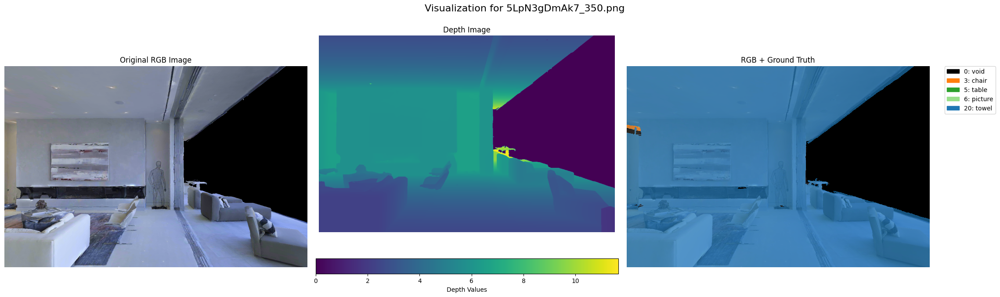

--- Displaying Frame 360 (5LpN3gDmAk7_360.png) ---


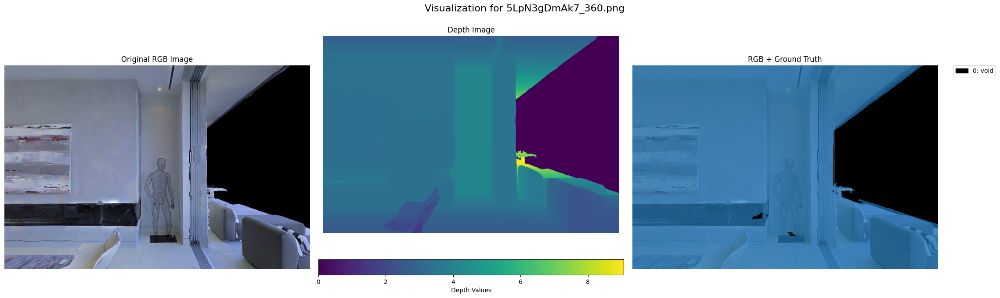

--- Displaying Frame 370 (5LpN3gDmAk7_370.png) ---


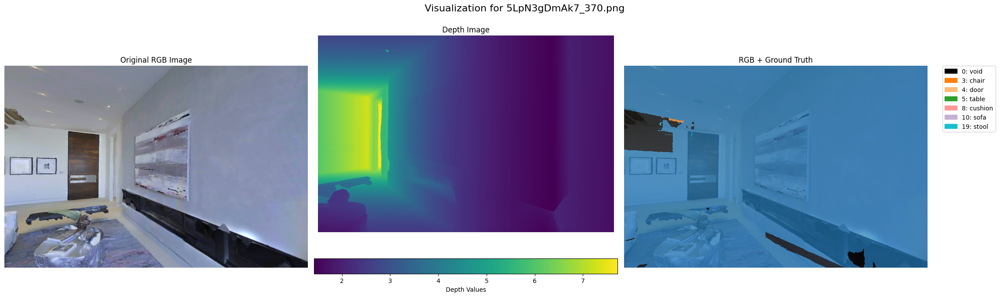

--- Displaying Frame 380 (5LpN3gDmAk7_380.png) ---


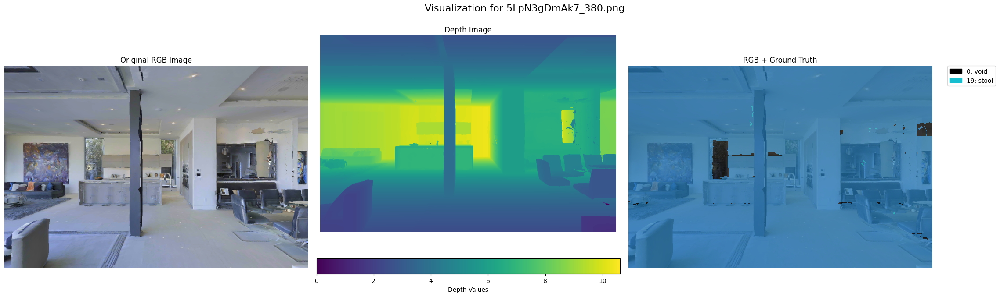

--- Displaying Frame 390 (5LpN3gDmAk7_390.png) ---


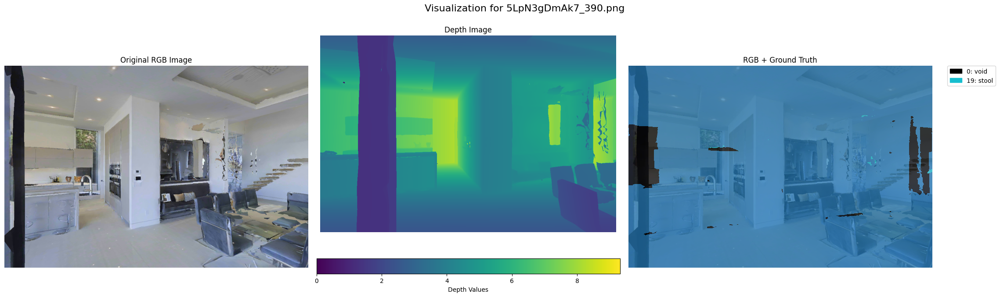

--- Displaying Frame 400 (5LpN3gDmAk7_400.png) ---


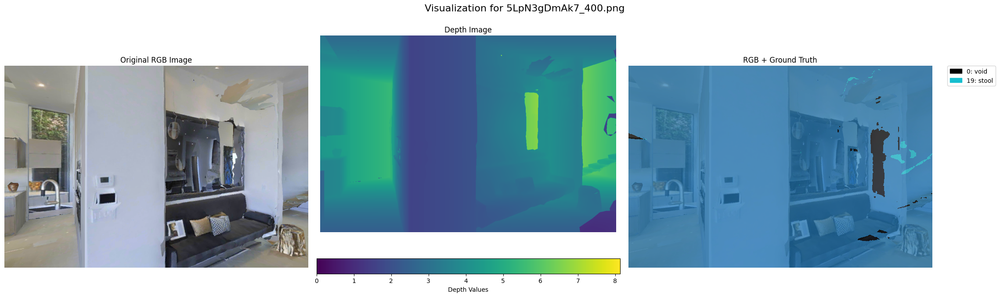

--- Displaying Frame 410 (5LpN3gDmAk7_410.png) ---


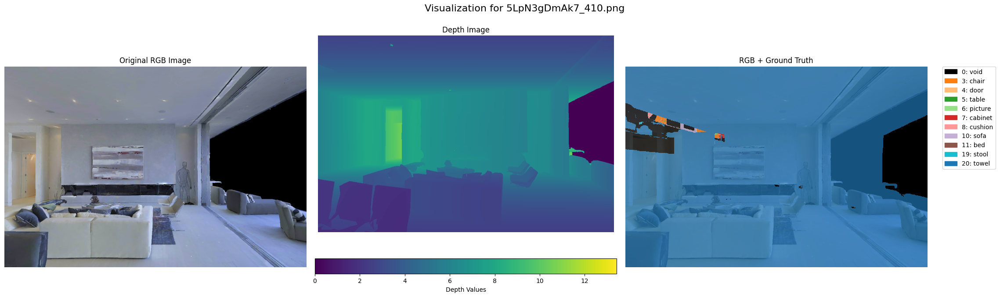

--- Displaying Frame 420 (5LpN3gDmAk7_420.png) ---


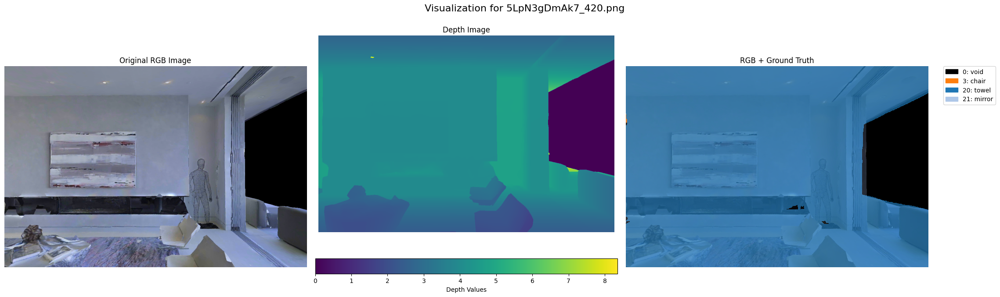

--- Displaying Frame 430 (5LpN3gDmAk7_430.png) ---


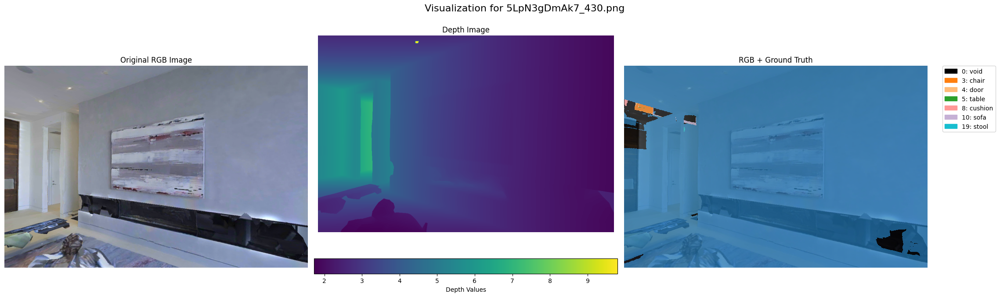

--- Displaying Frame 440 (5LpN3gDmAk7_440.png) ---


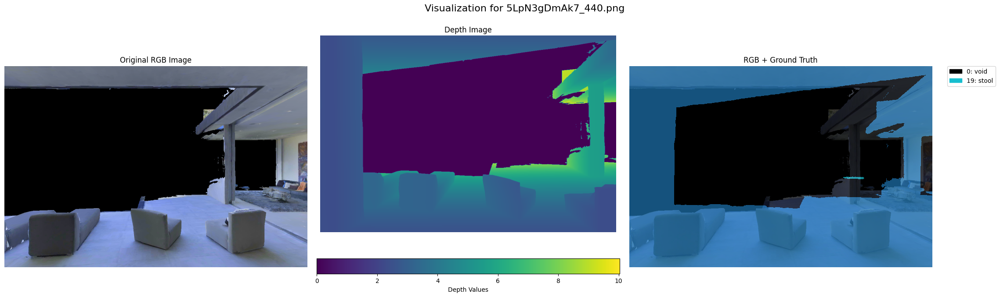

In [50]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch
from PIL import Image
# Assuming mp3dcat is available from your utils as in your notebook
# If not, you can replace it with the explicit list of class names.
from utils.mp3dcat import mp3dcat

def create_better_colormap(num_classes):
    """
    Creates a visually distinct colormap for a given number of classes using
    a standard Matplotlib colormap.
    """
    # Use Matplotlib's 'tab20' colormap, which provides 20 distinct colors.
    # We repeat the colors if there are more than 20 classes.
    base_cmap = plt.get_cmap('tab20', 20)

    # We'll create a list of colors. We can assign black to the 'void' class (ID 0)
    # for better visual separation.
    colors = [(0, 0, 0, 1)] # Black for 'void' class
    for i in range(1, num_classes):
        colors.append(base_cmap((i-1) % 19)) # Cycle through the other 19 colors of tab20

    return ListedColormap(colors)

def visualize_data_triplet(rgb_path, seg_path, depth_path, classes, alpha=0.7):
    """
    Loads and visualizes an RGB image, its depth map, and its ground truth
    segmentation mask using a clear and distinct colormap.
    """
    try:
        rgb_img = Image.open(rgb_path).convert("RGB")
        # Load ground truth segmentation mask from .npy file
        seg_mask = np.load(seg_path)
        # Load depth map from .npy file
        depth_map = np.load(depth_path)
    except FileNotFoundError as e:
        print(f"Error loading files: {e}. Please check the file paths.")
        return

    # Create our improved colormap
    colormap = create_better_colormap(len(classes))

    # Create the plot with 3 subplots
    fig, axes = plt.subplots(1, 3, figsize=(24, 7))
    fig.suptitle(f'Visualization for {os.path.basename(rgb_path)}', fontsize=16)

    # 1. Plot Original RGB Image
    axes[0].imshow(rgb_img)
    axes[0].set_title("Original RGB Image")
    axes[0].axis("off")

    # 2. Plot Depth Image
    # 'viridis' is a good colormap for representing depth data
    depth_display = axes[1].imshow(depth_map, cmap='viridis')
    axes[1].set_title("Depth Image")
    axes[1].axis("off")
    cbar = fig.colorbar(depth_display, ax=axes[1], orientation='horizontal', pad=0.1)
    cbar.set_label('Depth Values')

    # 3. Plot RGB Image with Ground Truth Segmentation Overlay
    axes[2].imshow(rgb_img)
    # Overlay the segmentation mask directly using the colormap
    axes[2].imshow(seg_mask, cmap=colormap, alpha=alpha, interpolation='none', vmin=0, vmax=len(classes)-1)
    axes[2].set_title("RGB + Ground Truth")
    axes[2].axis("off")

    # Create a legend for the segmentation classes present in this specific mask
    present_indices = np.unique(seg_mask)
    patches = [Patch(color=colormap(i), label=f"{i}: {classes[i]}")
               for i in present_indices if 0 <= i < len(classes)]
    if patches:
        axes[2].legend(handles=patches, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

    plt.tight_layout(rect=[0, 0, 0.95, 0.95])
    plt.show()

# --- Example Usage ---
# You can run this cell in your notebook to visualize a few frames.

# Assuming 'data_dir' is already defined from your setup cells
# e.g., data_dir = os.path.join(root_dir, "data", "5LpN3gDmAk7_1")
rgb_dir   = os.path.join(data_dir, "rgb")
seg_dir   = os.path.join(data_dir, "semantic")
depth_dir = os.path.join(data_dir, "depth")

# Your segmentation classes from the notebook
segmentation_classes = mp3dcat

# Get a sorted list of rgb files to ensure correct order
try:
    sorted_rgb = sorted(os.listdir(rgb_dir), key=lambda fn: int(fn.rsplit("_", 1)[-1].split(".")[0]))

    # Loop through a few example frames as in your original request
    for i in range(350, 450, 10):
        if i >= len(sorted_rgb):
            print(f"Reached end of file list at index {i}.")
            break

        fname = sorted_rgb[i]
        if not fname.lower().endswith(('.png', '.jpg', '.jpeg')):
            continue

        rgb_path = os.path.join(rgb_dir, fname)
        # Construct corresponding segmentation and depth paths
        base_name = fname.rsplit('.', 1)[0]
        seg_path = os.path.join(seg_dir, f'{base_name}.npy')
        depth_path = os.path.join(depth_dir, f'{base_name}.npy')

        if os.path.exists(seg_path) and os.path.exists(depth_path):
            print(f"--- Displaying Frame {i} ({fname}) ---")
            visualize_data_triplet(rgb_path, seg_path, depth_path, segmentation_classes)
        else:
            print(f"Skipping frame {i}: missing segmentation or depth file.")
            if not os.path.exists(seg_path): print(f"  - Missing: {seg_path}")
            if not os.path.exists(depth_path): print(f"  - Missing: {depth_path}")

except FileNotFoundError:
    print(f"Error: Could not find RGB directory at '{rgb_dir}'. Please check the 'data_dir' path.")

In [51]:
print(f"Classes: {len(segmentation_classes)}")
print(segmentation_classes)

Classes: 40
['void', 'wall', 'floor', 'chair', 'door', 'table', 'picture', 'cabinet', 'cushion', 'window', 'sofa', 'bed', 'curtain', 'chest_of_drawers', 'plant', 'sink', 'stairs', 'ceiling', 'toilet', 'stool', 'towel', 'mirror', 'tv_monitor', 'shower', 'column', 'bathtub', 'counter', 'fireplace', 'lighting', 'beam', 'railing', 'shelving', 'blinds', 'gym_equipment', 'seating', 'board_panel', 'furniture', 'appliances', 'clothes', 'objects']


# VLMaps Creation

In [52]:
# helper functions for visualization from utils.clip_mapping_utils.py
from PIL import Image
import matplotlib.patches as mpatches

def get_new_pallete(num_cls):
    n = num_cls
    pallete = [0] * (n * 3)

    for j in range(0, n):
        lab = j
        pallete[j * 3 + 0] = 0
        pallete[j * 3 + 1] = 0
        pallete[j * 3 + 2] = 0
        i = 0
        while lab > 0:
            pallete[j * 3 + 0] |= ((lab >> 0) & 1) << (7 - i)
            pallete[j * 3 + 1] |= ((lab >> 1) & 1) << (7 - i)
            pallete[j * 3 + 2] |= ((lab >> 2) & 1) << (7 - i)
            i = i + 1
            lab >>= 3
    return pallete

def get_new_mask_pallete(npimg, new_palette, out_label_flag=False, labels=None, ignore_ids_list=[]):
    """Get image color pallete for visualizing masks"""
    # put colormap
    out_img = Image.fromarray(npimg.squeeze().astype("uint8"))
    out_img.putpalette(new_palette)

    if out_label_flag:
        assert labels is not None
        u_index = np.unique(npimg)
        patches = []
        for i, index in enumerate(u_index):
            if index in ignore_ids_list:
                continue
            label = labels[index]
            cur_color = [
                new_palette[index * 3] / 255.0,
                new_palette[index * 3 + 1] / 255.0,
                new_palette[index * 3 + 2] / 255.0,
            ]
            red_patch = mpatches.Patch(color=cur_color, label=label)
            patches.append(red_patch)
    return out_img, patches

In [53]:
import os
import math
import numpy as np
import cv2
from tqdm import tqdm
import torch
import torchvision.transforms as transforms
from PIL import Image
from typing import Dict

# Assuming helper functions are in scope...
def create_feat_map_batch(models: Dict, img_save_dir: str, camera_height: float, cs: float = 0.05, gs: int = 1000, depth_sample_rate: int = 100):
    """
    Creates VLM-based feature maps in a batch process using a modular model handler.
    """
    mask_version = 1
    model_types = models["model_types"]
    prefix = model_types[0] if model_types else "map"

    print(f"Loading scene data from: {img_save_dir}")
    rgb_dir = os.path.join(img_save_dir, "rgb")
    depth_dir = os.path.join(img_save_dir, "depth")
    pose_dir = os.path.join(img_save_dir, "pose")
    semantic_dir = os.path.join(img_save_dir, "semantic")
    obj2cls_path = os.path.join(img_save_dir, "obj2cls_dict.txt")

    sort_key = lambda x: int(x.split("_")[-1].split(".")[0])
    rgb_list = sorted(os.listdir(rgb_dir), key=sort_key)
    depth_list = sorted(os.listdir(depth_dir), key=sort_key)
    pose_list = sorted(os.listdir(pose_dir), key=sort_key)
    semantic_list = sorted(os.listdir(semantic_dir), key=sort_key)

    rgb_list = [os.path.join(rgb_dir, x) for x in rgb_list]
    depth_list = [os.path.join(depth_dir, x) for x in depth_list]
    pose_list = [os.path.join(pose_dir, x) for x in pose_list]
    semantic_list = [os.path.join(semantic_dir, x) for x in semantic_list]

    map_save_dir = os.path.join(img_save_dir, "map")
    os.makedirs(map_save_dir, exist_ok=True)

    # --- MODIFIED: Use the prefix for all generated map files ---
    color_top_down_save_path = os.path.join(map_save_dir, f"{prefix}_color_top_down_{mask_version}.npy")
    gt_save_path = os.path.join(map_save_dir, f"{prefix}_grid_{mask_version}_gt.npy")
    obstacles_save_path = os.path.join(map_save_dir, f"{prefix}_obstacles.npy")

    color_top_down_height = (camera_height + 1) * np.ones((gs, gs), dtype=np.float32)
    color_top_down = np.zeros((gs, gs, 3), dtype=np.uint8)
    gt = np.zeros((gs, gs), dtype=np.int32)
    obstacles = np.ones((gs, gs), dtype=np.uint8)

    grids = {}
    weights = {}
    obj2cls = load_obj2cls_dict(obj2cls_path)
    tf_list = []
    
    data_iter = zip(rgb_list, depth_list, semantic_list, pose_list)
    print(f"Processing {len(rgb_list)} frames to build maps for models: {model_types}...")
    pbar = tqdm(total=len(rgb_list))

    for frame_idx, data_sample in enumerate(data_iter):
        rgb_path, depth_path, semantic_path, pose_path = data_sample
        bgr = cv2.imread(rgb_path)
        rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

        pos, rot = load_pose(pose_path)
        rot_ro_cam = np.eye(3); rot_ro_cam[1, 1] = -1; rot_ro_cam[2, 2] = -1
        rot = rot @ rot_ro_cam
        pos[1] += camera_height
        
        pose = np.eye(4); pose[:3, :3] = rot; pose[:3, 3] = pos.reshape(-1)
        tf_list.append(pose)
        if len(tf_list) == 1:
            init_tf_inv = np.linalg.inv(tf_list[0])
        tf = init_tf_inv @ pose

        depth = load_depth(depth_path)
        semantic = load_semantic(semantic_path)
        semantic = cvt_obj_id_2_cls_id(semantic, obj2cls)
        
        segmentation_outputs = segment_image(rgb, models)

        if frame_idx == 0:
            for model_name, (pix_feats, _, _, _) in segmentation_outputs.items():
                if pix_feats.ndim == 3:
                    feat_dim = pix_feats.shape[0]
                    print(f"Initializing grid for '{model_name}' with feature dimension {feat_dim}.")
                    grids[model_name] = np.zeros((gs, gs, feat_dim), dtype=np.float32)
                    weights[model_name] = np.zeros((gs, gs), dtype=float)
                else:
                    print(f"Warning: Cannot initialize grid for '{model_name}'. Features are not 3D (shape is {pix_feats.shape}).")

        # <<< FIX & EFFICIENCY IMPROVEMENT >>>
        # Pre-calculate feature camera matrices once per frame, not in the point loop.
        feat_cam_mats = {}
        for model_name, (pix_feats, _, _, _) in segmentation_outputs.items():
            if model_name in grids and pix_feats.ndim == 3:
                feat_cam_mats[model_name] = get_sim_cam_mat(pix_feats.shape[1], pix_feats.shape[2])

        pc, mask = depth2pc(depth)
        shuffle_mask = np.arange(pc.shape[1]); np.random.shuffle(shuffle_mask)
        shuffle_mask = shuffle_mask[::depth_sample_rate]
        mask = mask[shuffle_mask]
        pc = pc[:, shuffle_mask]; pc = pc[:, mask]
        pc_global = transform_pc(pc, tf)
        rgb_cam_mat = get_sim_cam_mat(rgb.shape[0], rgb.shape[1])
        
        for i, (p, p_local) in enumerate(zip(pc_global.T, pc.T)):
            x, y = pos2grid_id(gs, cs, p[0], p[2])

            if x >= gs or y >= gs or x < 0 or y < 0 or p_local[1] < -0.5:
                continue

            if p_local[1] < color_top_down_height[y, x]:
                rgb_px, rgb_py, _ = project_point(rgb_cam_mat, p_local)
                semantic_v = semantic[rgb_py, rgb_px]
                if semantic_v == 40: semantic_v = -1
                color_top_down[y, x] = rgb[rgb_py, rgb_px, :]
                color_top_down_height[y, x] = p_local[1]
                gt[y, x] = semantic_v

            if p_local[1] <= camera_height:
                obstacles[y, x] = 0

            for model_name, (pix_feats, _, _, _) in segmentation_outputs.items():
                # Use the pre-calculated matrix. Skip if not available for this model.
                if model_name not in feat_cam_mats:
                    continue
                
                feat_cam_mat = feat_cam_mats[model_name]
                px, py, _ = project_point(feat_cam_mat, p_local)

                if not (px < 0 or py < 0 or px >= pix_feats.shape[2] or py >= pix_feats.shape[1]):
                    feat = pix_feats[:, py, px]
                    grid = grids[model_name]
                    weight = weights[model_name]
                    grid[y, x] = (grid[y, x] * weight[y, x] + feat) / (weight[y, x] + 1)
                    weight[y, x] += 1
        
        pbar.update(1)
    
    pbar.close()
    
    print("Saving maps...")
    save_map(color_top_down_save_path, color_top_down)
    save_map(gt_save_path, gt)
    save_map(obstacles_save_path, obstacles)

    for model_name in model_types:
        if model_name in grids:
            grid_save_path = os.path.join(map_save_dir, f"{model_name}_grid_{mask_version}.npy")
            weight_save_path = os.path.join(map_save_dir, f"{model_name}_weight_{mask_version}.npy")
            save_map(grid_save_path, grids[model_name])
            save_map(weight_save_path, weights[model_name])
            print(f"Saved '{model_name}' feature map to {grid_save_path}")

    print("Map creation complete. ✨")

In [54]:
# 1. Define parameters for map creation
device = "cuda" if torch.cuda.is_available() else "cpu"
# Use the same classes for all models for a fair comparison
segmentation_classes = ["door", "chair", "ground", "ceiling", "wall", "floor", "table", "other"]

# Map and data settings from your context
cs = 0.05
gs = 1000
camera_height = 1.5
depth_sample_rate = 100

# 2. Initialize the models you want to run
# This example loads both LSeg and OpenSeeD
print("--- Initializing Models ---")
models_to_run = initialize_models(
    CFG_FILE, 
    WGT_FILE,
    segmentation_classes=segmentation_classes,
    # Specify which models to load and use
    model_types=["openseed"], #, "openseed"],
    lseg_ckpt_path=os.path.join(root_dir, "lseg/checkpoints/demo_e200.ckpt"),
    device=device
)
print("--- Model Initialization Complete ---")

# 3. Call the map creation function with the initialized models
create_feat_map_batch(models=models_to_run, img_save_dir=data_dir, camera_height=camera_height, cs=cs, gs=gs, depth_sample_rate=depth_sample_rate)

--- Initializing Models ---
Loading OpenSeeD model with new loader…
self.task_switch  {'coco': True, 'o365': True}


--- Model Initialization Complete ---
Loading scene data from: /home/jovyan/teaching_material/msc/MSc-Thesis/data/5LpN3gDmAk7_1
Processing 1159 frames to build maps for models: ['openseed']...


  0%|          | 0/1159 [00:00<?, ?it/s]

Initializing grid for 'openseed' with feature dimension 512.


100%|██████████| 1159/1159 [20:48<00:00,  1.08s/it]


Saving maps...
/home/jovyan/teaching_material/msc/MSc-Thesis/data/5LpN3gDmAk7_1/map/color_top_down_1.npy is saved.
/home/jovyan/teaching_material/msc/MSc-Thesis/data/5LpN3gDmAk7_1/map/grid_1_gt.npy is saved.
/home/jovyan/teaching_material/msc/MSc-Thesis/data/5LpN3gDmAk7_1/map/obstacles.npy is saved.
/home/jovyan/teaching_material/msc/MSc-Thesis/data/5LpN3gDmAk7_1/map/grid_openseed_1.npy is saved.
/home/jovyan/teaching_material/msc/MSc-Thesis/data/5LpN3gDmAk7_1/map/weight_openseed_1.npy is saved.
Saved 'openseed' feature map to /home/jovyan/teaching_material/msc/MSc-Thesis/data/5LpN3gDmAk7_1/map/grid_openseed_1.npy
Map creation complete. ✨


# Landmark Indexing

## Load packages

In [55]:
%matplotlib inline
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from utils.clip_mapping_utils import load_map, get_new_pallete, get_new_mask_pallete
from utils.clip_utils import get_text_feats
from utils.mp3dcat import mp3dcat
import clip

## Setup Load Paths

Set `use_self_built_map` to False to use the map we provided, and set it to True if you want to try the map you built in the `VLMap Creation` section.

In [56]:
MODEL_TYPE = "openseed"

In [57]:
use_self_built_map = True

if use_self_built_map:
    map_save_dir = os.path.join(data_dir, "map")
    mask_version = 1
    color_top_down_save_path = os.path.join(map_save_dir, f"{prefix}_color_top_down_{mask_version}.npy")
    gt_save_path = os.path.join(map_save_dir, f"{prefix}_grid_{mask_version}_gt.npy")
    obstacles_save_path = os.path.join(map_save_dir, f"{prefix}_obstacles.npy")
    grid_save_path = os.path.join(map_save_dir, f"{model_name}_grid_{mask_version}.npy")
    weight_save_path = os.path.join(map_save_dir, f"{model_name}_weight_{mask_version}.npy")
else:
    map_save_dir = os.path.join(data_dir, "map_correct")
    # grid_save_path = os.path.join(map_save_dir, "grid_1_gt.npy") # ground truth predictions
    grid_save_path = os.path.join(map_save_dir, "grid_lseg_1.npy")
    color_top_down_save_path = os.path.join(map_save_dir, "color_top_down_1.npy")
    obstacles_save_path = os.path.join(map_save_dir, "obstacles.npy")
    # gt_save_path = os.path.join(map_save_dir, f"{prefix}_grid_{mask_version}_gt.npy")
    # weight_save_path = os.path.join(map_save_dir, f"{model_name}_weight_{mask_version}.npy")

os.makedirs(map_save_dir, exist_ok=True)

## Show Obstacle Map

[0 1]


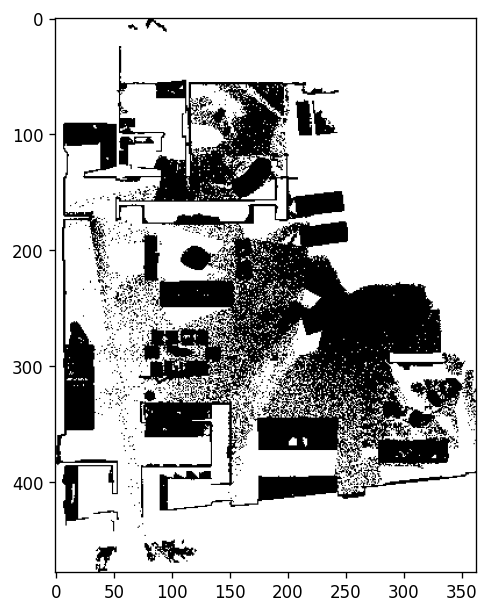

In [58]:
obstacles = load_map(obstacles_save_path)
x_indices, y_indices = np.where(obstacles == 0)

xmin = np.min(x_indices)
xmax = np.max(x_indices)
ymin = np.min(y_indices)
ymax = np.max(y_indices)

print(np.unique(obstacles))
obstacles_pil = Image.fromarray(obstacles[xmin:xmax+1, ymin:ymax+1])
plt.figure(figsize=(8, 6), dpi=120)
plt.imshow(obstacles_pil, cmap='gray')
plt.show()

you can see that the obstacles are black and the free space is white. You can also observe noisy black points lying on the ground. These points are caused by the slope or different floor heights in the scene.

## Show Top-Down Color Map

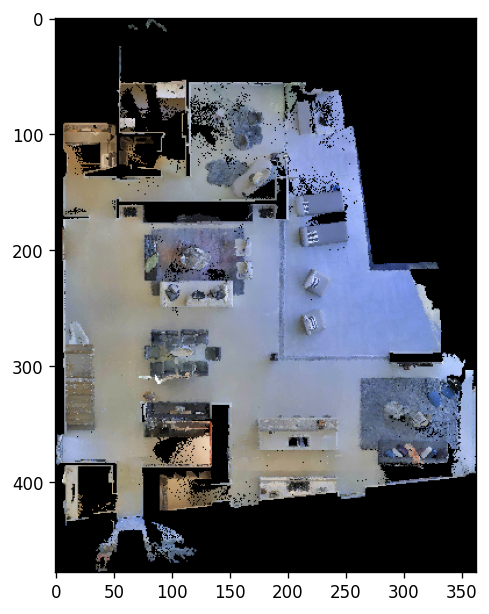

In [59]:
color_top_down = load_map(color_top_down_save_path)
color_top_down = color_top_down[xmin:xmax+1, ymin:ymax+1]
color_top_down_pil = Image.fromarray(color_top_down)
plt.figure(figsize=(8, 6), dpi=120)
plt.imshow(color_top_down_pil)
plt.show()

the color map is created by projecting the color-augmented point cloud to the floor.

## Show Landmark Indexing Results

In [60]:
%%capture
device = "cuda" if torch.cuda.is_available() else "cpu"
clip_version = "ViT-B/32"
clip_feat_dim = {'RN50': 1024, 'RN101': 512, 'RN50x4': 640, 'RN50x16': 768,
                'RN50x64': 1024, 'ViT-B/32': 512, 'ViT-B/16': 512, 'ViT-L/14': 768}[clip_version]
clip_model, preprocess = clip.load(clip_version) # clip.available_models()
clip_model.to(device).eval()

In [61]:
grid = load_map(grid_save_path)
grid = grid[xmin:xmax+1, ymin:ymax+1]

In [62]:
# # L2 Normalize the grid features
# # reshape to (H*W, D), compute per-cell norms, avoid divide-by-zero, renormalize
# H, W, D = grid.shape
# flat = grid.reshape(-1, D).astype(np.float32)
# norms = np.linalg.norm(flat, axis=1, keepdims=True)
# norms[norms == 0] = 1.0
# flat /= norms
# grid = flat.reshape(H, W, D)

In [63]:
models = initialize_models(
    CFG_FILE,
    WGT_FILE,
    segmentation_classes=segmentation_classes,
    model_types=["openseed"],
    lseg_ckpt_path=os.path.join(root_dir, "lseg", "checkpoints", "demo_e200.ckpt"),
    device="cuda"
)

Loading OpenSeeD model with new loader…
self.task_switch  {'coco': True, 'o365': True}


we use the text form of all semantic categories provided by the Matterport3D dataset as prompts to the VLMap and localize all categories in the map. We filter out "floor" category.

In [64]:
no_map_mask = obstacles[xmin:xmax+1, ymin:ymax+1] > 0
obstacles_rgb = np.repeat(obstacles[xmin:xmax+1, ymin:ymax+1, None], 3, axis=2)
print(no_map_mask.shape)

lang = mp3dcat
text_feats = get_text_features(lang, models) # uses global variable MODEL_TYPE!
# if MODEL_TYPE=="openseed":
#     text_feats = openseed_text(lang)
#     text_feats = text_feats.astype(np.float32)
#     tnorms = np.linalg.norm(text_feats, axis=1, keepdims=True)
#     tnorms[tnorms == 0] = 1.0
#     text_feats /= tnorms
# elif MODEL_TYPE=="lseg":
#     text_feats = get_text_feats(lang, clip_model, clip_feat_dim) # 512-D

# if grid.shape[-1] != text_feats.shape[1]:
#     print("adjusted text_feature shape")
#     text_feats = text_feats[:, :grid.shape[-1]] # 512 -> 256

# Enforce that feature dimensions must match
assert grid.shape[-1] == text_feats.shape[1], \
    f"Dimension mismatch! Grid features have {grid.shape[-1]} dims (or {grid.shape}), " \
    f"but text features have {text_feats.shape[1]} dims (or {text_feats.shape}). " \
    "Models are incompatible."

map_feats = grid.reshape((-1, grid.shape[-1]))
scores_list = map_feats @ text_feats.T

predicts = np.argmax(scores_list, axis=1)
predicts = predicts.reshape((xmax - xmin + 1, ymax - ymin + 1))
floor_mask = predicts == 2

new_pallete = get_new_pallete(len(lang))
mask, patches = get_new_mask_pallete(predicts, new_pallete, out_label_flag=True, labels=lang)
seg = mask.convert("RGBA")
seg = np.array(seg)
seg[no_map_mask] = [225, 225, 225, 255]
seg[floor_mask] = [225, 225, 225, 255]
seg = Image.fromarray(seg)
plt.figure(figsize=(10, 6), dpi=120)
plt.legend(handles=patches, loc='upper left', bbox_to_anchor=(1., 1), prop={'size': 10})
plt.axis('off')
plt.title("VLMaps")
plt.imshow(seg)
plt.show()

(478, 363)
Generating text features using OPENSEED...


AssertionError: Dimension mismatch! Grid features have 256 dims (or (478, 363, 256)), but text features have 512 dims (or (40, 512)). Models are incompatible.

## Open-Vocabulary Landmark Indexing

In addition to using the fixed set of categories, we can also use customized text prompts to the map and index their corresponding locations. You could play around with the `lang` variable below by providing your own prompt. 

In [ ]:
# @markdown Input the prompt as a string of object names separated by ","
lang = "big flat counter, sofa, floor, chair, wash basin, other" # @param {type: "string"} # wash basin instead of seating, wall <- other
lang = lang.split(",")
# if MODEL_TYPE=="openseed":
#     text_feats = openseed_text(lang) # (K,512)
# elif MODEL_TYPE=="lseg":
#     text_feats = get_text_feats(lang, clip_model, clip_feat_dim)

text_feats = get_text_features(lang, models) # uses global variable MODEL_TYPE!

# make dimensions match the grid
# if grid.shape[-1] != text_feats.shape[1]:
#     print("adjusted text features shape to fit with visual features")
#     text_feats = text_feats[:, :grid.shape[-1]] # truncate 512 -> 256

# Enforce that feature dimensions must match
assert grid.shape[-1] == text_feats.shape[1], \
    f"Dimension mismatch! Grid features have {grid.shape[-1]} dims, " \
    f"but text features have {text_feats.shape[1]} dims. " \
    "Models are incompatible."

map_feats = grid.reshape((-1, grid.shape[-1]))
scores_list = map_feats @ text_feats.T

predicts = np.argmax(scores_list, axis=1)
predicts = predicts.reshape((xmax - xmin + 1, ymax - ymin + 1))
floor_mask = predicts == 2

new_pallete = get_new_pallete(len(lang))
mask, patches = get_new_mask_pallete(predicts, new_pallete, out_label_flag=True, labels=lang)
seg = mask.convert("RGBA")
seg = np.array(seg)
seg[no_map_mask] = [225, 225, 225, 255]
seg[floor_mask] = [225, 225, 225, 255]
seg = Image.fromarray(seg)
plt.figure(figsize=(10, 6), dpi=120)
plt.legend(handles=patches, loc='upper left', bbox_to_anchor=(1., 1), prop={'size': 10})
plt.axis('off')
plt.title("VLMaps")
plt.imshow(seg)
plt.show()

# Evaluation

In [ ]:
# All helper functions in this cell are self-contained and correct.
# Note: The function `get_text_features` is NO LONGER defined here.
# We will use the global one defined in an earlier cell.

def compute_iou(gt, pred, num_classes):
    """Computes IoU for each class."""
    ious = []
    for cls in range(num_classes):
        intersection = np.logical_and(gt == cls, pred == cls).sum()
        union = np.logical_or(gt == cls, pred == cls).sum()
        # If the class is not in the ground truth or prediction, IoU is NaN.
        ious.append(np.nan if union == 0 else intersection / union)
    return ious

def compute_pixel_accuracy(gt, pred):
    """Computes pixel accuracy, ignoring void/negative classes in GT."""
    valid = gt >= 0  # A common convention is to ignore negative labels in GT.
    return (gt[valid] == pred[valid]).sum() / valid.sum()

def predict_and_evaluate(gt, grid, text_feats, labels):
    """Generates predictions from a feature grid and evaluates against GT."""
    # Enforce that feature dimensions must match.
    assert grid.shape[-1] == text_feats.shape[1], \
        f"Dimension mismatch! Grid features have {grid.shape[-1]} dims, " \
        f"but text features have {text_feats.shape[1]} dims. Models are incompatible."

    # Reshape grid for matrix multiplication and get predictions
    h, w, d = grid.shape
    scores = grid.reshape(-1, d) @ text_feats.T
    pred = scores.argmax(axis=1).reshape(h, w)

    # Calculate and print metrics
    ious = compute_iou(gt, pred, len(labels))
    acc = compute_pixel_accuracy(gt, pred)
    
    print("-" * 50)
    print(f"Evaluation for Labels: {labels}")
    print("Per-class IoU:", ", ".join(f"{label}: {iou:.4f}" for label, iou in zip(labels, ious)))
    # Use np.nanmean to correctly ignore NaN values (for classes not present)
    print(f"Mean IoU (mIoU): {np.nanmean(ious):.4f}")
    print(f"Pixel Accuracy: {acc:.4f}")
    print("-" * 50)


    # Visualize the results
    fig, axes = plt.subplots(1, 2, figsize=(16, 7))
    cmap = 'jet' # Use a standard colormap

    im1 = axes[0].imshow(gt, cmap=cmap, vmin=0, vmax=len(labels)-1)
    axes[0].set_title("Ground Truth (Cropped)")
    axes[0].axis('off')
    
    im2 = axes[1].imshow(pred, cmap=cmap, vmin=0, vmax=len(labels)-1)
    axes[1].set_title("VLMaps Prediction (Cropped)")
    axes[1].axis('off')
    
    # Add a shared colorbar
    fig.colorbar(im2, ax=axes.ravel().tolist(), orientation='vertical', ticks=range(len(labels)), label='Class ID')
    plt.tight_layout()
    plt.show()

def run_map_evaluation(models, gt_path, grid_path, crop_bounds):
    """
    Main function to run the evaluation pipeline.
    
    Args:
        models (Dict): The initialized models dict from initialize_models().
        gt_path (str): Path to the ground truth .npy map.
        grid_path (str): Path to the feature grid .npy map.
        crop_bounds (Tuple): A tuple of (xmin, xmax, ymin, ymax) for cropping.
    """
    xmin, xmax, ymin, ymax = crop_bounds
    
    print("--- Starting VLMaps Evaluation ---")
    
    # 1. Load and CROP both the GT and the prediction grid
    print(f"Loading ground truth map from: {gt_path}")
    gt_full = np.load(gt_path)
    gt_cropped = gt_full[xmin:xmax+1, ymin:ymax+1]
    
    print(f"Loading feature grid from: {grid_path}")
    grid_full = np.load(grid_path)
    grid_cropped = grid_full[xmin:xmax+1, ymin:ymax+1]
    
    print(f"Map shape after cropping: {gt_cropped.shape}")

    # 2. Define label sets for evaluation
    label_sets_to_test = [
        mp3dcat, # Full MP3D-CAT classes
        ["door", "chair", "ground", "ceiling", "wall", "floor", "table", "other"] # Custom smaller set
    ]

    # 3. Loop through label sets, get features, and evaluate
    for labels in label_sets_to_test:
        # Use the GLOBAL get_text_features function defined earlier
        text_feats = get_text_features(labels, models)
        predict_and_evaluate(gt_cropped, grid_cropped, text_feats, labels)

# --- EXECUTION ---
# This assumes the variables `models`, `gt_path`, `grid_save_path`, and the
# crop boundaries (`xmin`, `xmax`, etc.) are available from the previous cells.
# For example, your `models` dict might be named `models_to_run`.

# Define the paths for clarity
gt_path = os.path.join(data_dir, "map_correct", "grid_1_gt.npy")
grid_path_to_eval = grid_save_path # This was defined in your first visualization cell

# Define the crop bounds tuple
# This assumes xmin, xmax, ymin, ymax were defined when you loaded the obstacle map
crop_bounds = (xmin, xmax, ymin, ymax)

# Run the main evaluation function with the correct, initialized models
# IMPORTANT: Use the actual variable name for your initialized models dict.
# It might be `models`, `models_to_run`, `models_for_nyu`, etc.
run_map_evaluation(models, gt_path, grid_path_to_eval, crop_bounds)

In [ ]:
map_save_location = os.path.join(root_dir, "data", "my_maps", "openseed_vlmap.npy")
os.makedirs(os.path.dirname(map_save_location), exist_ok=True)
np.save(map_save_location, predicts)

# Citation
If you find this code useful to you, please cite our paper. You can find more results on the website of our paper [here](https://vlmaps.github.io/).
```
@article{huang22vlmaps,
  title     = {Visual Language Maps for Robot Navigation},
  author    = {Chenguang Huang and Oier Mees and Andy Zeng and Wolfram Burgard},
  journal   = {arXiv preprint arXiv:2210.05714},
  year      = {2022},
}
```